# CMPINF 2100: Spotify Songs Final Project

## Stephanie Harris

## Table of Contents
#### A. Introduction
#### B. EDA
#### C. Clustering
#### D. Models: Fitting & Interpretation
#### E. Models: Predictions
#### F. Models: Performance & Validation

## A. Introduction

### Overview

This project approached Spotify song prediction as a **classification** problem rather than a regression problem. Although the original output `track_popularity` is a numerical score between 0 and 100, it is a bounded variable, meaning regression models could produce impossible values (e.g. −10 or 120) and confidence intervals that extend outside the valid range. Following course guidance, I converted the continuous score into a binary outcome, classifying songs as `popular (1)` if their popularity score was above `50` and not `popular (0)` otherwise. This resulted in a reasonably balanced outcome, making it best for logistic regression and other classification methods used throughout the analysis.

#### Why Not Regression?

EDA revealed that the popularity distribution had a strong spike at zero (about 8% of songs). Because standard regression assumes Gaussian errors without bounds, applying it directly would violate assumptions and produce unrealistic predictions. Converting the outcome to a classification problem avoided these issues and aligned better with the project goals.

### Variable Selection

#### Continuous Inputs

* `danceability`
* `energy`
* `loudness`
* `speechiness`
* `acousticness`
* `instrumentalness`
* `liveness`
* `valence`
* `tempo`
* `duration_ms`

#### Categorical Inputs

* `playlist_genre`
* `key` (converted into musical labels C, C#, D, …)
* `mode` (major / minor)

#### Output Variable

* `track_popularity_binary`

#### Variables only used for EDA

* `track_album_year`
* `track_album_decade`
* `playlist_subgenre`

#### ID Variables not used in Models

* `track_id`: Unique identifier for each track 
* `track_name`: Text label, not an informative feature
* `track_artist`: While the track artist could have some influence on the target variable, this field is categorical with many unique values.
* `track_album_id`: Unique identifier for each track album
* `track_album_name`: Text identifier
* `playlist_name`: Playlist name is also text identifier
* `playlist_id`: Unique playlist identifier with no modeling value

### Major Findings

Across the full analysis of EDA, clustering, and predictive modeling, the most influential features for predicting popularity were `playlist_genre`, `loudness`, and `energy`. Genre was the strongest categorical predictor: pop, rap, latin, r&b, and rock consistently showed higher odds of being in the “popular” class. `Loudness` had a positive relationship with `popularity` across all models. `Energy` was statistically significant but often negative when adjusting for other features, suggesting that high energy songs are not automatically more popular once `genre` and `loudness` are accounted for. Other features such as `danceability`, `tempo`, `instrumentalness`, and `acousticness` had smaller effects.

#### Support from EDA, Predictive Models, and Clustering

The EDA showed genre-level differences in `loudness`, `danceability`, `energy`, and `speechiness`, which supported the idea that `genre` captures important stylistic differences not explained by continuous audio features alone. KDE plots comparing popular vs. non-popular songs showed only modest separation for most continuous variables, reinforcing that audio features alone only weakly predict `popularity`.

The predictive models proved these findings: `genre` had the strongest coefficients, `loudness` was consistently positive, and `energy` became negative once other factors were included. The most flexible model (`Model 6`), which included categorical and continuous interactions, achieved the highest ROC AUC and accuracy.

The clustering analysis also supported these insights. K-means clusters grouped songs based on musical characteristics (e.g. high energy EDM/rock vs. more acoustic latin/rap), and these clusters aligned closely with `genre`rather than `popularity`. This confirmed that `popularity` appears to depend on factors beyond audio descriptors alone, such as playlist curation, artist reputation, or external exposure.

### Final Model Selection

Using 5-fold stratified cross-validation, `Model 6` was the top performer. Although it is the most complex model in the set (198 coefficients), it produced the highest average testing accuracy and best generalization. `Model 4` (additive model) performed almost as well with far fewer coefficients, but `Model 6` provided a small improvement that held up during validation.

### Skills Learned

Throughout this project, I developed practical skills in EDA, handling skewed variables, applying log transformations, standardizing inputs, interpreting logistic regression coefficients, tuning model complexity, and validating model performance with cross-validation. I also gained experience combining unsupervised learning (clustering) with supervised methods to form a more complete understanding of the data. These skills are directly applicable to machine learning workflows, I now understand that preprocessing, model selection, and evaluation are critical for building reliable prediction tools.

These skills directly support my career goals in data analytics and data science. I feel confident to tackle more complex real world datasets and build realistic models in my future work.

### Import Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import statsmodels.formula.api as smf

from scipy.cluster import hierarchy

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

### Read Data  

In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

In [3]:
df = pd.read_csv(songs_url)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

## B. Exploratory Data Analysis

### Basic Information

In [5]:
# Display the number of rows and columns

df.shape

(32833, 23)

In [6]:
# Display the column names and their associated data types.  

df.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

In [7]:
# Display the number of missing values for each column.  

df.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

In [8]:
# drop rows with missing values

df_clean = df.dropna().reset_index(drop=True).copy()

In [9]:
df_clean.isna().sum()

track_id                    0
track_name                  0
track_artist                0
track_popularity            0
track_album_id              0
track_album_name            0
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

In [10]:
# Display the number of unique values for each column

df_clean.nunique()

track_id                    28352
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22543
track_album_name            19743
track_album_release_date     4529
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17682
duration_ms                 19782
dtype: int64

### Data Cleaning

Before proceeding with the visualizations, I performed some data cleaning. Please refer to the EDA file for further explanation on this process.

#### Group by `track_id`

To remove duplicate tracks, I grouped by `track_id`, keeping the first occurrence of track-specific variables and the most common value for playlist related fields.

In [11]:
unique_cols = [
    'track_name', 'track_artist', 'track_popularity', 
    'track_album_id', 'track_album_name', 'track_album_release_date',
    'danceability', 'energy', 'key', 'loudness', 'mode',
    'speechiness', 'acousticness', 'instrumentalness', 
    'liveness', 'valence', 'tempo', 'duration_ms'
]
non_unique_cols = ['playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre']

agg_dict = {col: (lambda x: x.mode().iloc[0]) for col in non_unique_cols}
agg_dict.update({col: 'first' for col in unique_cols})

df_clean = df_clean.groupby('track_id').agg(agg_dict).reset_index()

In [12]:
df_clean.shape

(28352, 23)

#### Convert `track_album_release_date`

I converted `track_album_release_date` into a standardized date format and extracted the album’s release year and decade as categorical variables for easier analysis.

While I did not use `track_album_year` or `track_album_decade` as input variables, they were helpful for exploratory visualizations.

In [13]:
def normalize(x):
    x_str = str(x).strip()
    if x_str == "" or pd.isna(x):
        return None  # keep missing as None
    parts = x_str.split('-')
    if len(parts) == 1:  # year only
        return x_str + "-01-01"
    elif len(parts) == 2:  # year-month only
        return x_str + "-01"
    else:  # full date
        return x_str
        
df_clean['track_album_release_date_normalized'] = df_clean['track_album_release_date'].apply(normalize)
df_clean['track_album_release_date_dt'] = pd.to_datetime(
    df_clean['track_album_release_date_normalized'],
    errors='coerce'
)
df_clean['track_album_year'] = df_clean['track_album_release_date_dt'].dt.year.astype('Int64')
df_clean['track_album_decade'] = (df_clean['track_album_year'] // 10 * 10).astype('Int64')
df_clean['track_album_year'] = df_clean['track_album_year'].astype('category')
df_clean['track_album_decade'] = df_clean['track_album_decade'].astype('category')



In [14]:
df_clean[['track_album_release_date', 'track_album_decade']].head(5)

,track_album_release_date,track_album_decade
0,2001-01-01,2000
1,2018-01-26,2010
2,2017-11-21,2010
3,2015-08-07,2010
4,2018-11-16,2010


In [15]:
df_clean[['track_album_release_date_dt', 'track_album_year', 'track_album_decade']].isna().sum()

track_album_release_date_dt    0
track_album_year               0
track_album_decade             0
dtype: int64

#### Convert `track_popularity` to a categorical variable

As seen below, `track_popularity` is a bounded variable. To address this, I will converted it into a categorical variable, starting with `track_popularity > 50` for the purposes of the EDA visualizations.

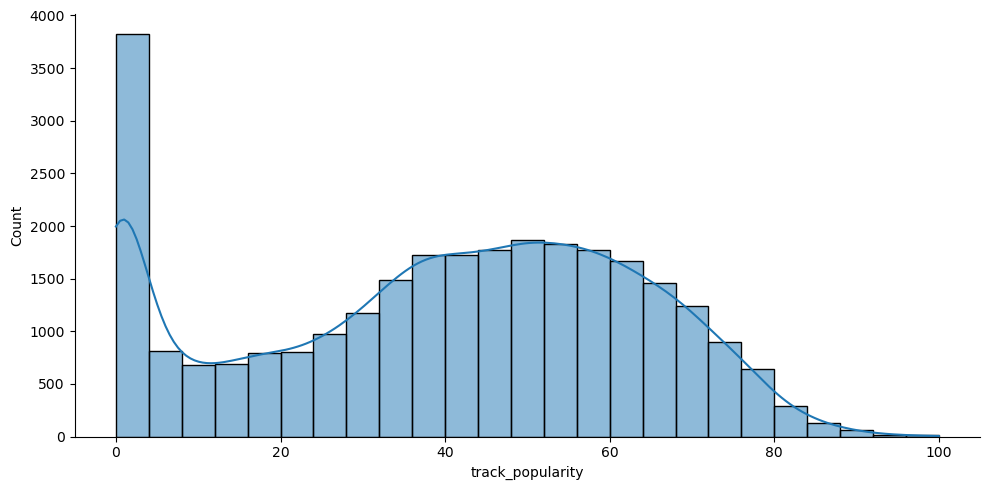

In [16]:
sns.displot(data=df_clean, x='track_popularity', bins=25, kde=True, aspect=2)

plt.show()

In [17]:
df_clean['track_popularity_binary'] = np.where( df_clean.track_popularity > 50, 1, 0 )

In [18]:
df_clean.track_popularity_binary.value_counts(normalize=True)

track_popularity_binary
0    0.629444
1    0.370556
Name: proportion, dtype: float64

#### Convert `key` and `mode` into categorical variables

I converted `key` into categorical musical labels:

In [19]:
df_clean['key'] = df_clean['key'].astype('category')

In [20]:
key_mapping = {0: 'C', 
               1: 'C♯/D♭', 
               2: 'D', 
               3: 'D♯/E♭', 
               4: 'E',
               5: 'F', 
               6: 'F♯/G♭', 
               7: 'G', 
               8: 'G♯/A♭', 
               9: 'A',
               10: 'A♯/B♭', 
               11: 'B',
               -1: 'No Key Detected'}

In [21]:
df_clean['key'] = df_clean['key'].map(key_mapping)

I converted `mode` into Major/Minor labels:

In [22]:
df_clean['mode'] = df_clean['mode'].astype('category')

In [23]:
mode_mapping = {0: 'minor', 
                1: 'major'}

In [24]:
df_clean['mode'] = df_clean['mode'].map(mode_mapping)

### Visualizations

#### Counts of categorical variables

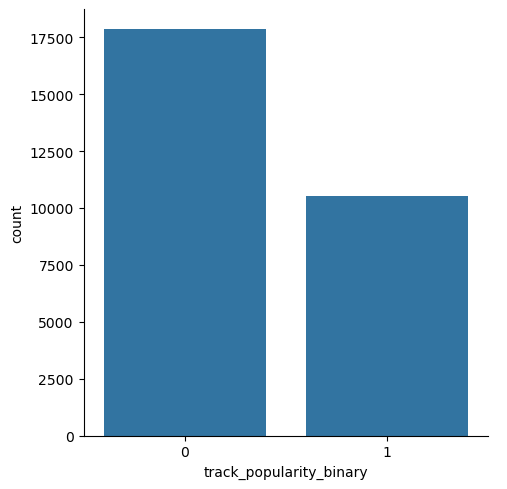

In [25]:
sns.catplot(data=df_clean, x='track_popularity_binary', kind='count')

plt.show()

After converting `track_popularity` into a binary variable, the majority of songs fall into the "unpopular" category at `.63`. This creates a moderately imbalanced outcome distribution. The bar chart reflects this imbalance, showing far more tracks labeled 0 than 1.

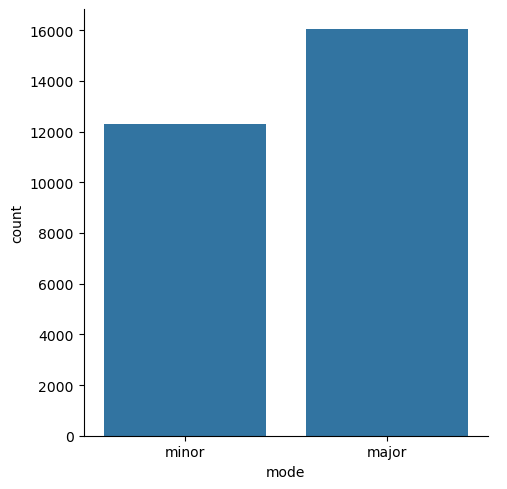

In [26]:
sns.catplot(data=df_clean, x='mode', kind='count')

plt.show()

More songs are written in a `major` key rather than a `minor` key in this dataset.

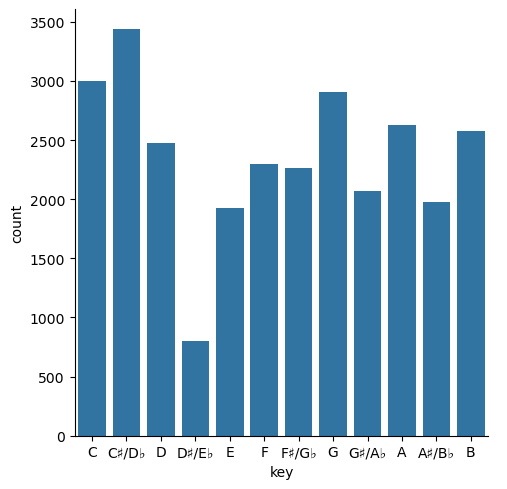

In [27]:
sns.catplot(data=df_clean, x='key', kind='count')

plt.show()

The musical key distribution is fairly diverse, with C♯/D♭ appearing most often and D♯/E♭ being the least common.

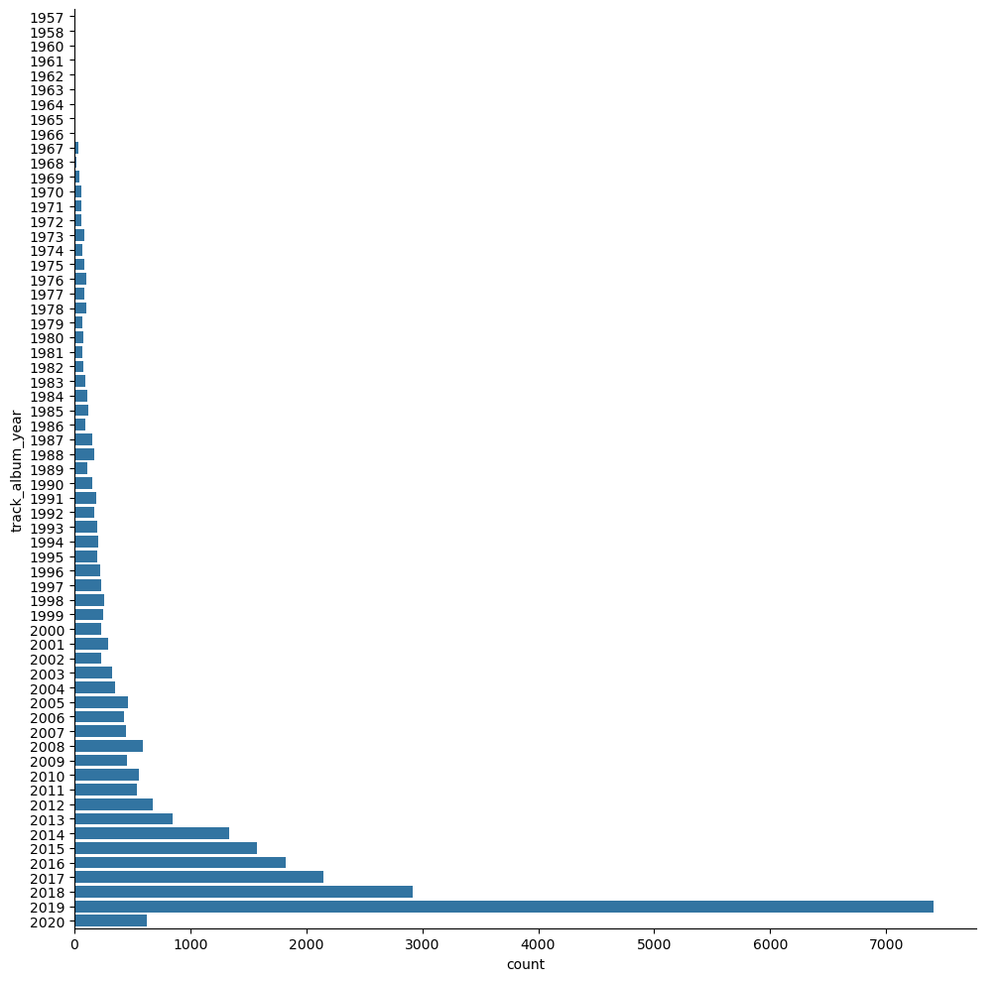

In [28]:
sns.catplot(data=df_clean, y='track_album_year', kind='count', height=10)

plt.show()

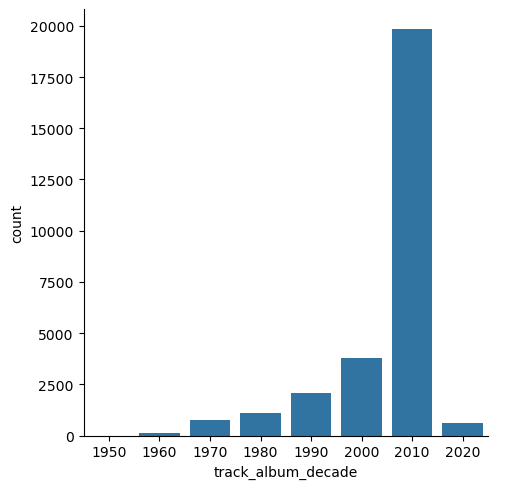

In [29]:
sns.catplot(data=df_clean, x='track_album_decade', kind='count')

plt.show()

In looking at the bar charts for `track_album_year`, and `track_album_decade`, most of the songs in the data set were released more recently. A majority of the songs were released the `decade` 2010 and in the `year` 2019.

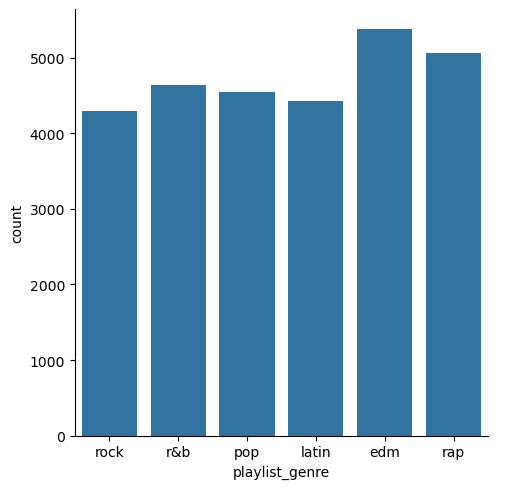

In [30]:
sns.catplot(data=df_clean, x='playlist_genre', kind='count')

plt.show()

The `playlist_genre` categories are fairly balanced, with each genre represented in similar amounts, though EDM and rap appear slightly more common than the others.

Since `playlist_subgenre` is not used as an input variable, it is not included in the final report. Those visualizations can be found in the `EDA` supporting document.

#### Distributions of continuous variables

In [31]:
# Convert to long format

df_clean_numeric_names = ['danceability','energy','loudness','speechiness','acousticness',
             'instrumentalness','liveness','valence','tempo', 'duration_ms']

df_clean_object_names = ['track_popularity_binary', 'track_id','playlist_name','playlist_id','playlist_genre',
'track_name','track_artist','track_album_id','track_album_name','track_album_release_date', 'mode', 'key']

df_clean_lf = df_clean.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid']+df_clean_object_names,
    value_vars=df_clean_numeric_names)

In [32]:
df_clean_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283520 entries, 0 to 283519
Data columns (total 15 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   rowid                     283520 non-null  int64   
 1   track_popularity_binary   283520 non-null  int64   
 2   track_id                  283520 non-null  object  
 3   playlist_name             283520 non-null  object  
 4   playlist_id               283520 non-null  object  
 5   playlist_genre            283520 non-null  object  
 6   track_name                283520 non-null  object  
 7   track_artist              283520 non-null  object  
 8   track_album_id            283520 non-null  object  
 9   track_album_name          283520 non-null  object  
 10  track_album_release_date  283520 non-null  object  
 11  mode                      283520 non-null  category
 12  key                       283520 non-null  category
 13  variable                  283

In [33]:
len(df_clean_numeric_names)*df_clean.shape[0] == df_clean_lf.shape[0]

True

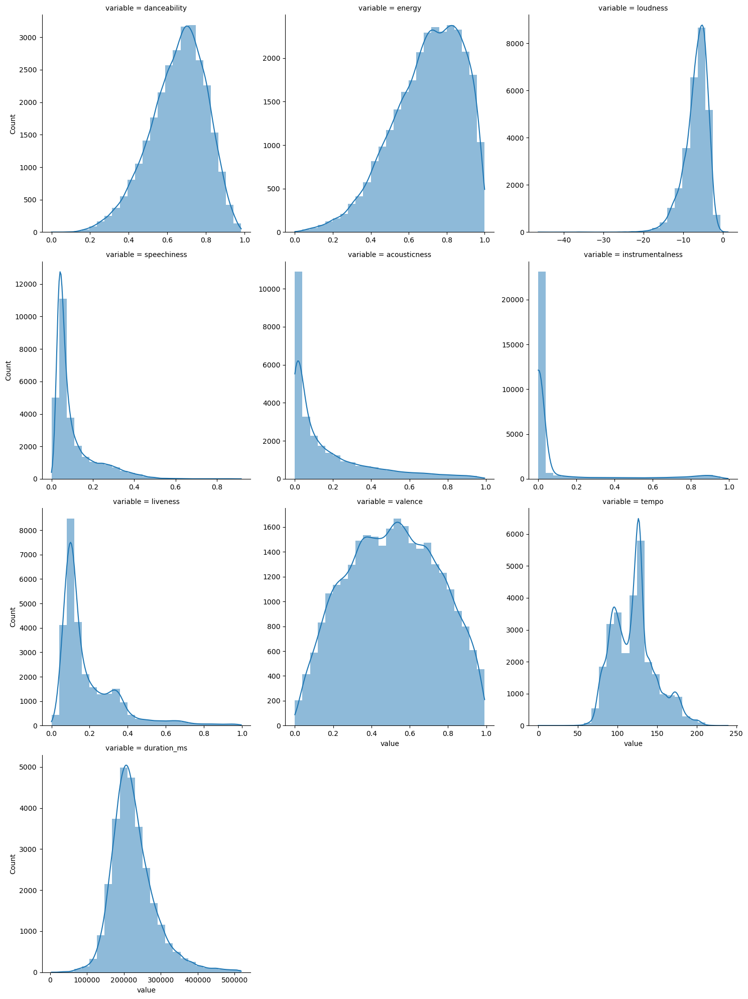

In [34]:
# Visualize the continuous input distributions

sns.displot(data=df_clean_lf, x='value', col='variable', kind='hist', bins=25, kde=True,
            col_wrap=3, facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, common_norm=False)

plt.show()

`danceability`, `energy`, `valence`, and `duration_ms` show roughly bell-shaped or symmetric distributions, which shows these features vary smoothly across songs.

`Loudness`, `speechiness`, `acousticness`, `instrumentalness`, and `liveness` are strongly right-skewed with many tracks clustered near zero.

`tempo` has two peaks, which suggests there are two common tempo groups of songs: one slower and one faster.

**The continuous marginal distribution for `track_popularity` is shown in the above `Data Cleaning` section.**

### Relationships between continuous variables

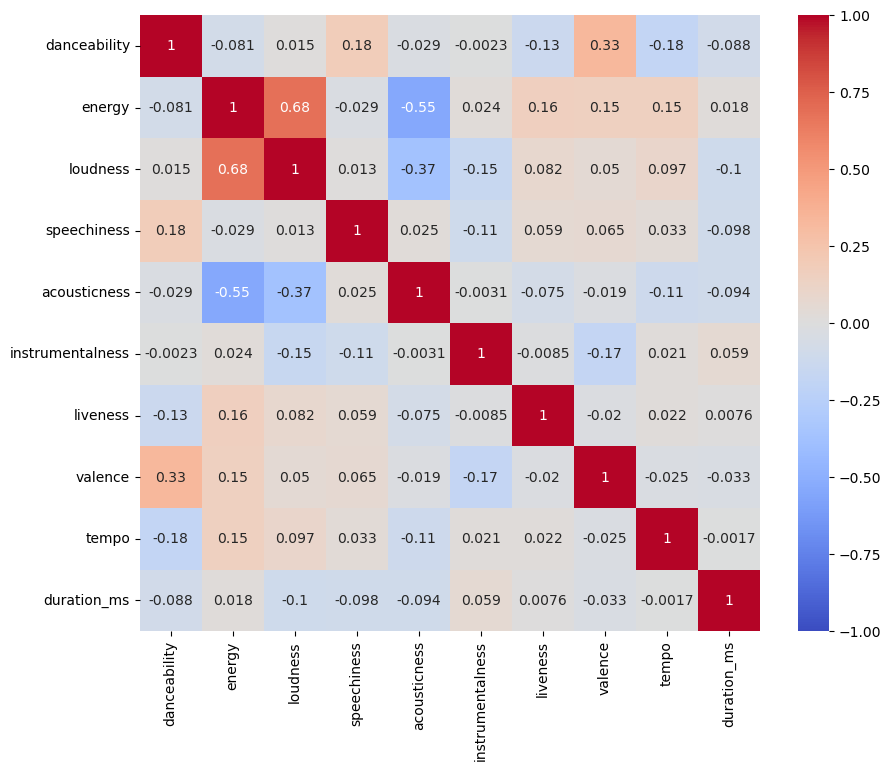

In [35]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.heatmap(data = df_clean.loc[:, ['danceability','energy','loudness','speechiness','acousticness',
             'instrumentalness','liveness','valence','tempo', 'duration_ms']].corr(),
            vmin=-1, vmax=1, center = 0,
            cmap='coolwarm',
            annot=True, annot_kws={'size': 10},
            ax=ax)

plt.show()

`energy` and `loudness` show a strong positive correlation, meaning that higher energy tracks are typically produced at louder volumes.

`danceability` and `valence` show a mild positive correlation, indicating that songs with a more positive emotional tone tend to be somewhat more danceable.

`acousticness` is slighly negatively correlated with both `energy` and `loudness`, indicating that acoustic tracks are generally quieter and less energetic.

All the other feature pairs show very weak correlations, indicating that most continuous variables capture independent aspects of the audio features.

Pairplot visualizations are included in the supporting `EDA` file.

### Continuous variables grouped by categorical **input** variables

Based on the EDA supporting file, `playlist_genre` shows the clearest differences in the continuous feature distributions, while `key` and `mode` show much smaller between group variation. 

Because the genre better highlights meaningful structure in the data, I chose to present the `playlist_genre` comparisons in the main report. The grouped plots for `key` and `mode` are included in the supporting `EDA` file.

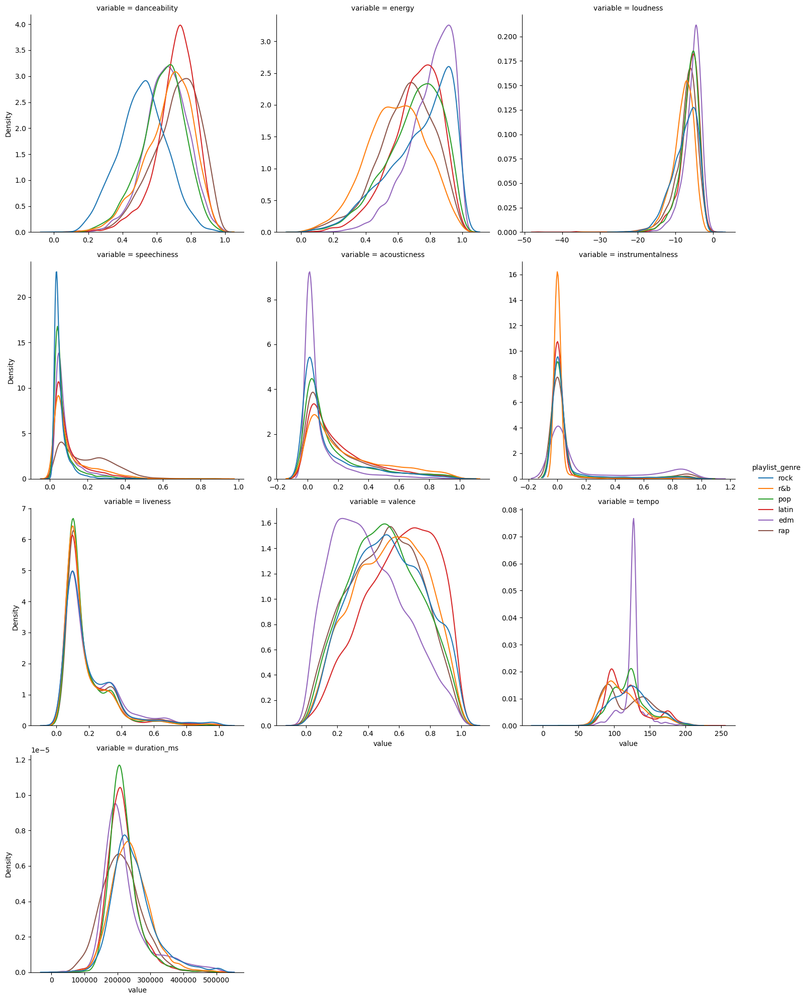

In [36]:
sns.displot(data=df_clean_lf, x='value', col='variable', hue='playlist_genre', kind='kde',
            common_norm=False, col_wrap=3,
            facet_kws={'sharex': False, 'sharey': False})

plt.show()

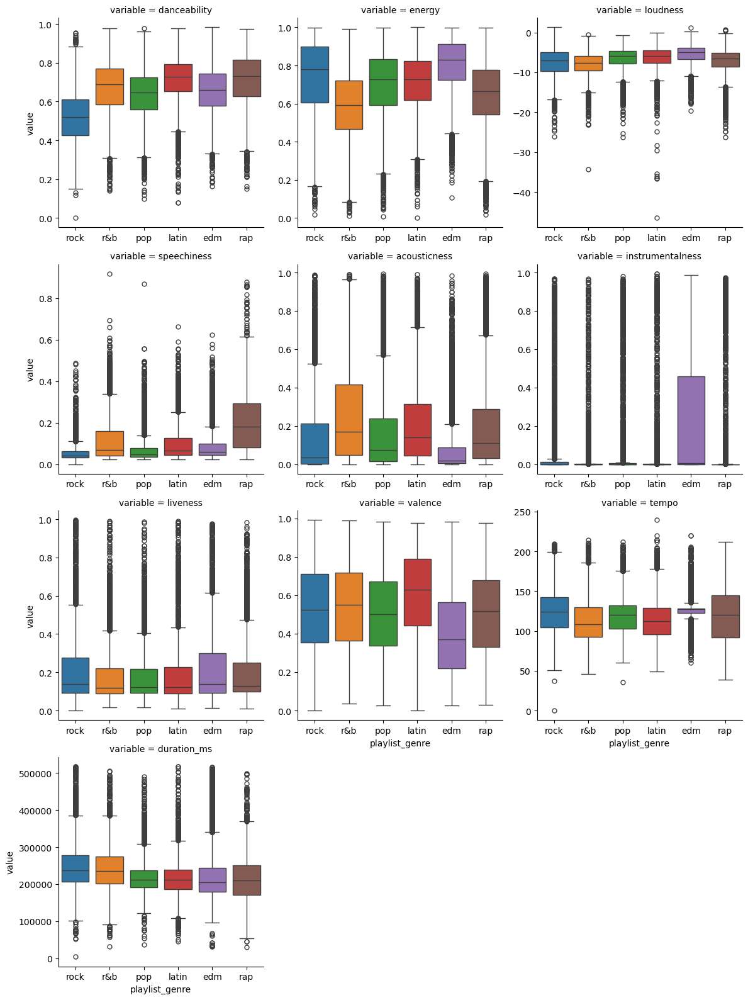

In [37]:
sns.catplot(
    data=df_clean_lf, x='playlist_genre', y='value', col='variable', kind='box',
    col_wrap=3, height=4,
    sharex=False, sharey=False,
    hue='playlist_genre'
)

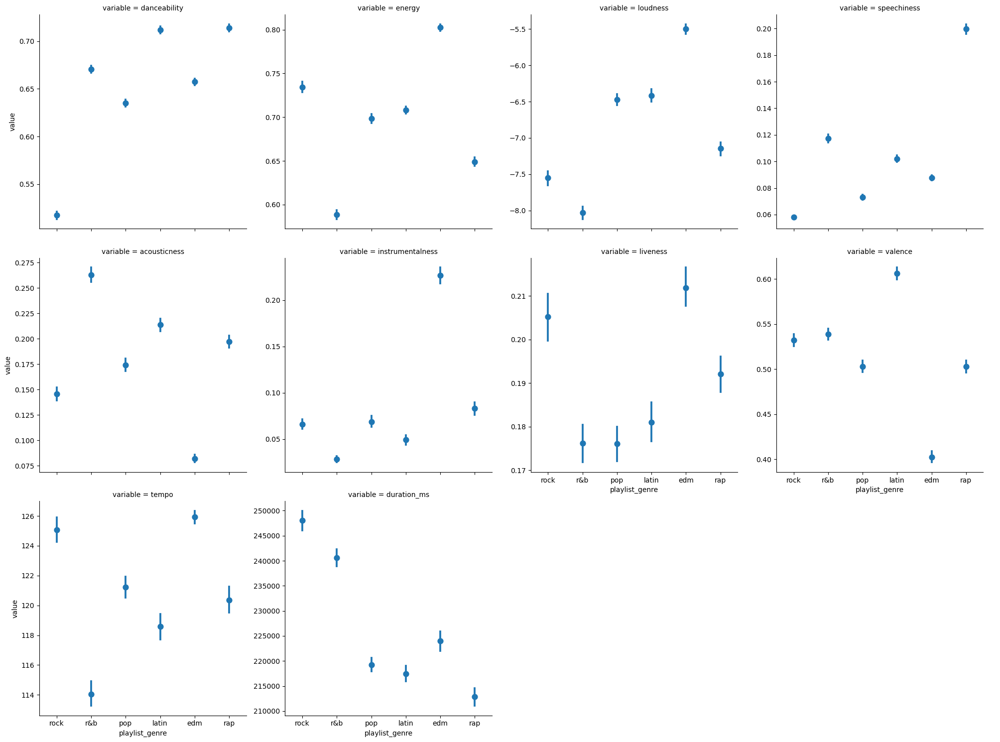

In [38]:
sns.catplot(data = df_clean_lf, x='playlist_genre', y='value', col='variable', kind='point',
            col_wrap=4, sharey=False, join=False)

plt.show()

Across all three visualization types, several of the continuous features show clear genre related patterns, while others remain fairly similar across genres. 

Features such as `energy`, `loudness`, and `danceability` show clear separation, with EDM and pop tending to be higher energy and louder, while rock and r&b appear slightly lower. 

Variables like `speechiness` and `instrumentalness` also show genre specific tendencies. For example, rap songs have higher `speechiness`, while EDM shows a wider spread in instrumentalness. 

In contrast, features such as `liveness`, `valence`, and `duration_ms` show more overlap between genres.

#### Marginal distributions of continuous variables grouped by the **output** variable

KDE plots were shown rather than histograms for clearer visibility between categories.

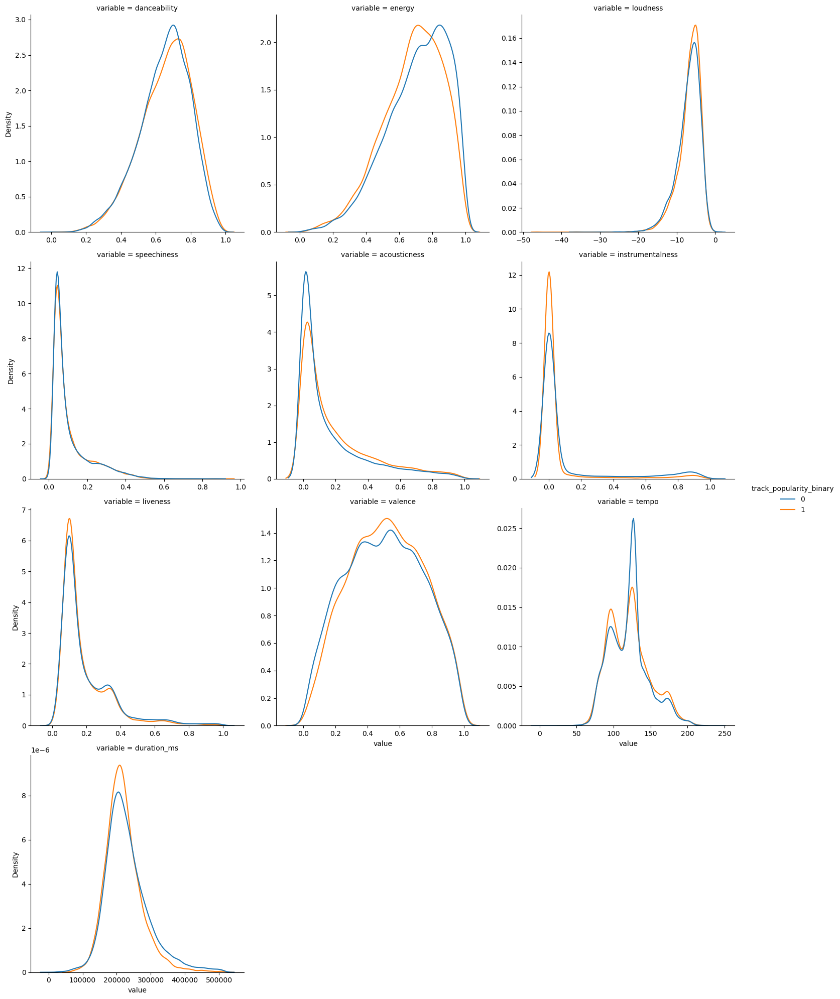

In [39]:
sns.displot(data=df_clean_lf, x='value', col='variable', hue='track_popularity_binary', kind='kde',
            common_norm=False, col_wrap=3,
            facet_kws={'sharex': False, 'sharey': False})

plt.show()

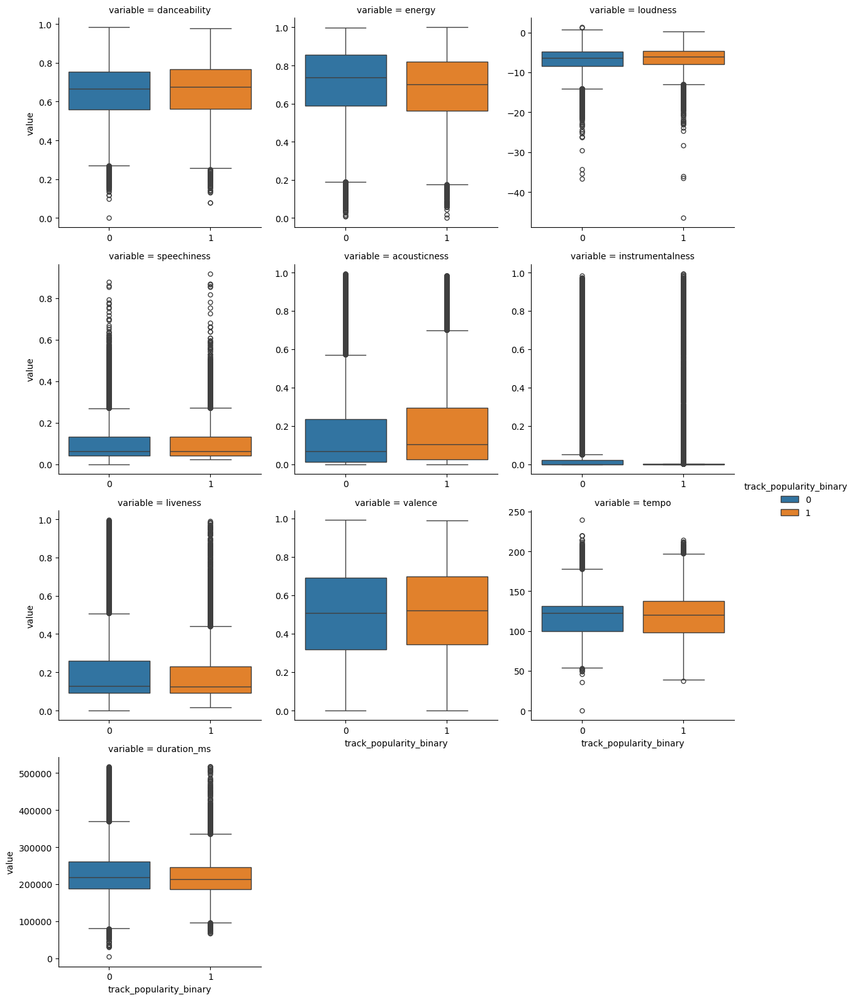

In [40]:
# Use boxplots to compare summary statistics

sns.catplot(
    data=df_clean_lf, x='track_popularity_binary', y='value', col='variable', kind='box',
    col_wrap=3, height=4,
    sharex=False, sharey=False,
    hue='track_popularity_binary'
)

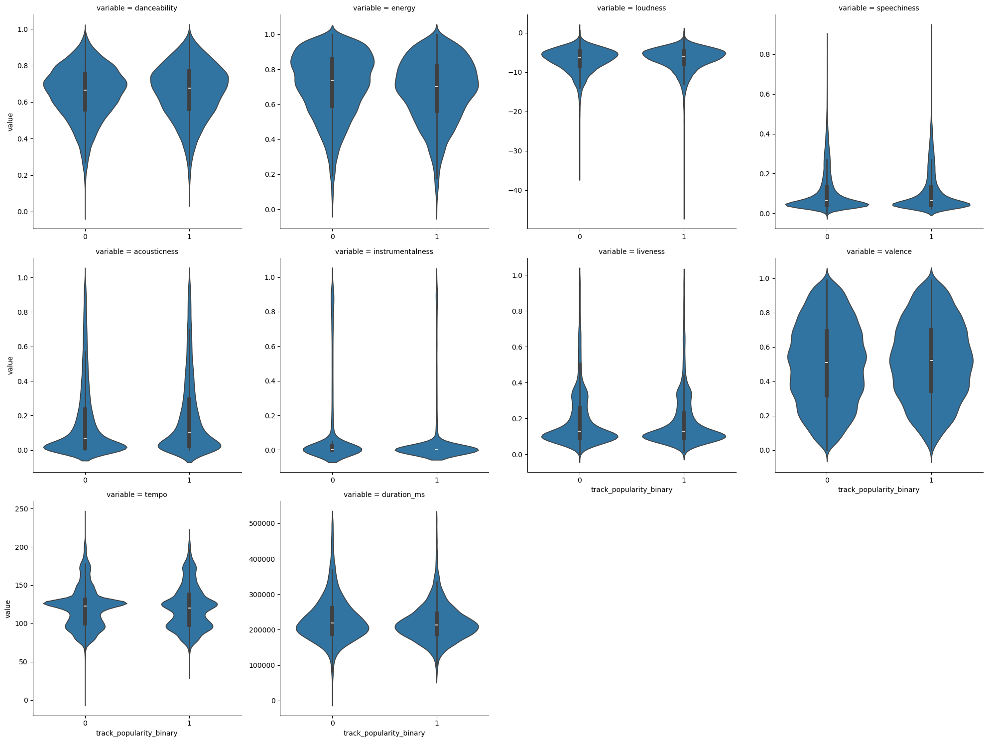

In [41]:
# Use a violin plot to compare the conditional distribution shapes

sns.catplot(
    data=df_clean_lf, x='track_popularity_binary', y='value', col='variable', kind='violin',
    col_wrap=4, sharex=False, sharey=False, 
    common_norm=False)
plt.show()

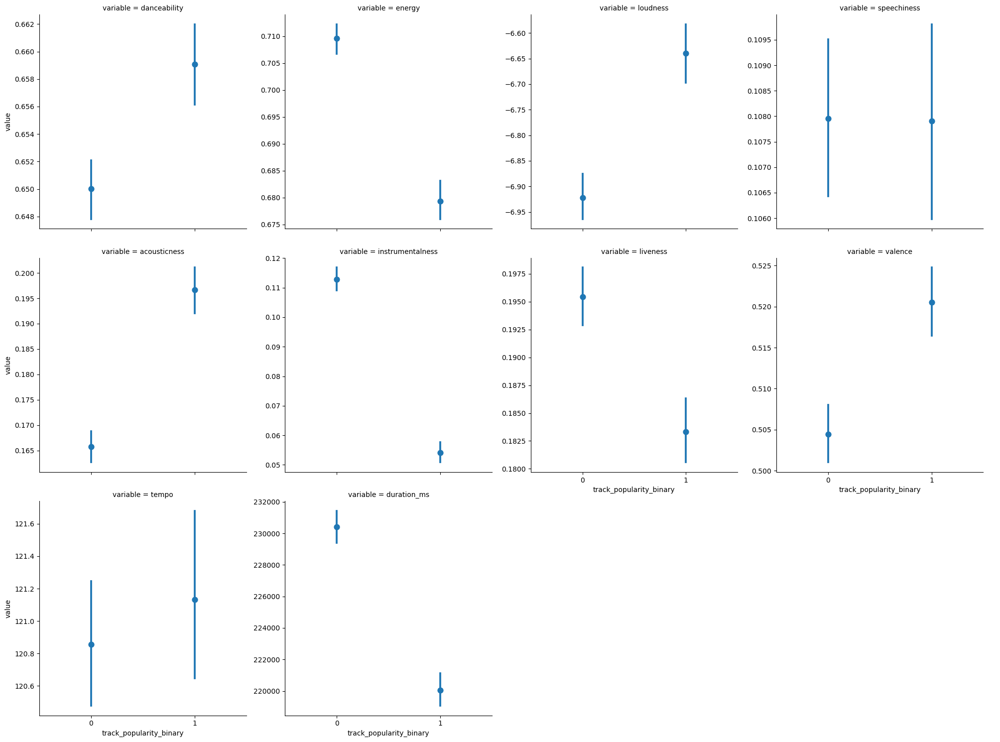

In [42]:
sns.catplot(data = df_clean_lf, x='track_popularity_binary', y='value', col='variable', kind='point',
            col_wrap=4, sharey=False, join=False)

plt.show()

Across all visualization types, the distributions for popular vs. non-popular tracks look very similar for most audio features. 

The differences that do appear tend to show slightly higher `danceability`, `loudness`, `valence`, and `tempo`, while non-popular tracks show marginally higher `acousticness` and `instrumentalness`. 

Overall, the continuous variables show only mild shifts with popularity which indicates that popularity is not strongly driven by any single audio feature.

### Relationships between continuous inputs grouped by the **outcome** unique values

Since there are several continuous variables, I will do a pairplot for a couple different subsets: *Energy features* and *Energy acoustic features*

In [43]:
energy_features = ['energy', 'loudness', 'danceability', 'valence', 'tempo']

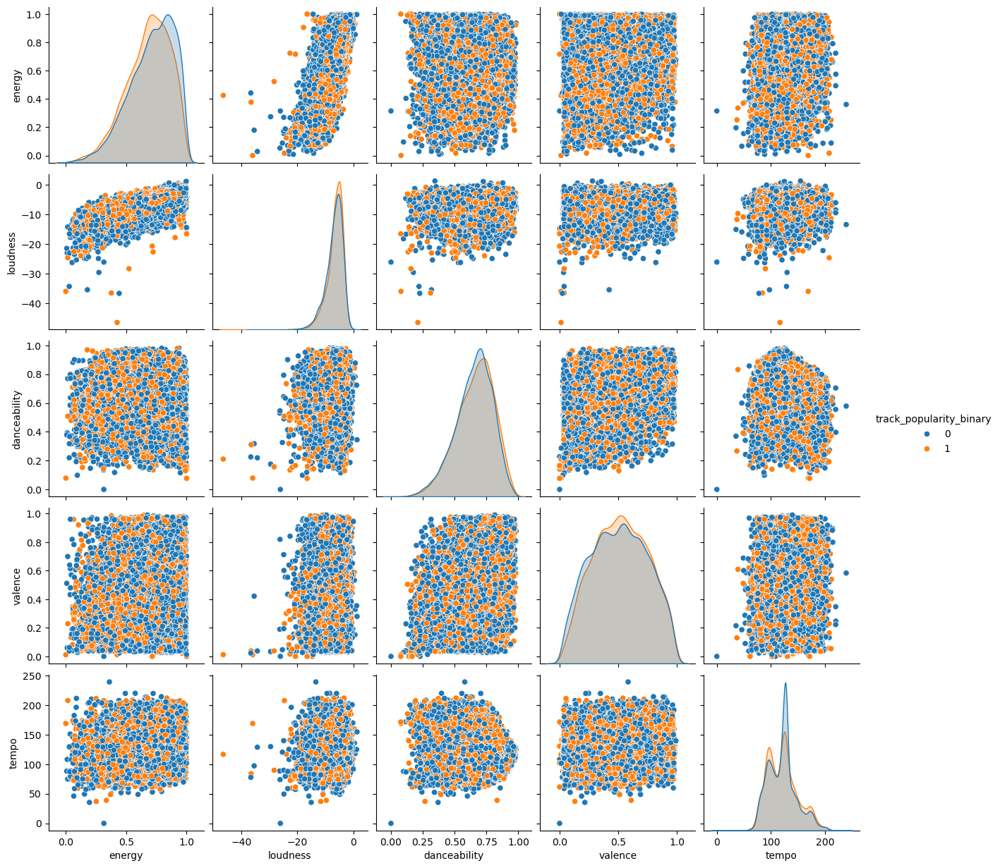

In [44]:
sns.pairplot( data = df_clean, x_vars = energy_features,
             y_vars = energy_features,
             hue='track_popularity_binary',
             diag_kws={'common_norm': False})

plt.show()

In [45]:
energy_acoustic_features = ['energy', 'loudness', 'acousticness']

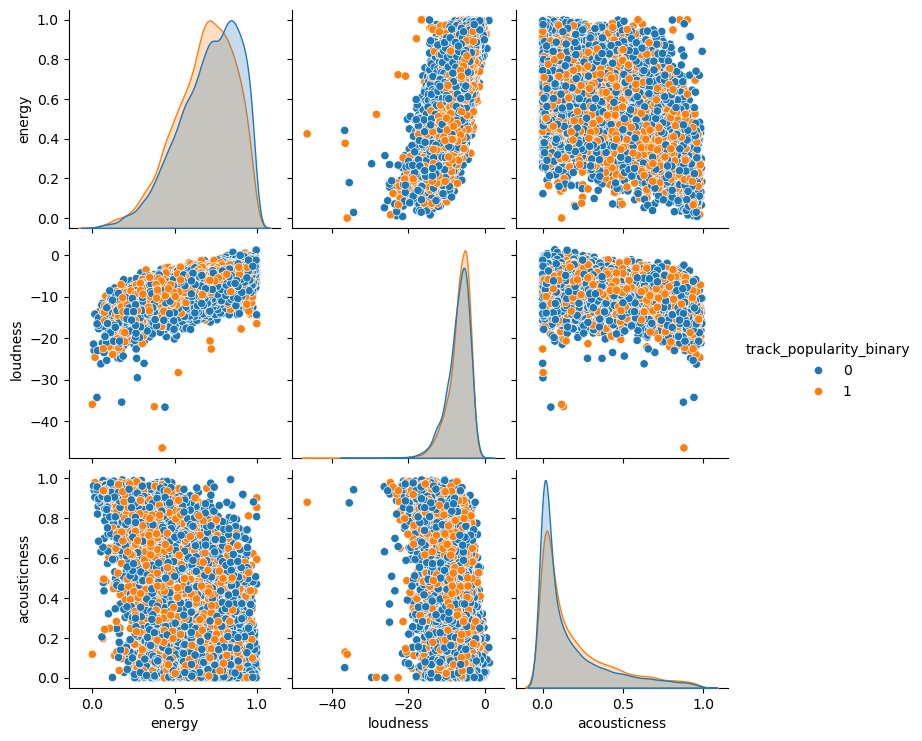

In [46]:
sns.pairplot(data = df_clean, x_vars = energy_acoustic_features,
             y_vars = energy_acoustic_features,
             hue='track_popularity_binary',
             diag_kws={'common_norm': False})

plt.show()

Across all pairplots, the popular and non-popular songs look very similar. This indicates that popularity doesn’t strongly change the overall shape of these relationships, and the continuous features don’t form clearly separated groups.

#### Count the number of observations for each combination of **outcome** unique value and the categorical input unique values. 

Heatmaps shown in supporting `EDA` file.

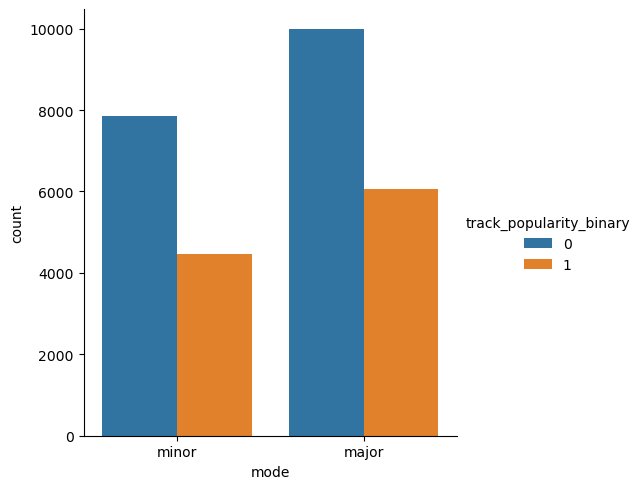

In [47]:
sns.catplot(data = df_clean, x='mode', hue='track_popularity_binary', kind='count')

plt.show()

Songs in both `minor` and `major` mode appear in similar proportions across popularity levels, suggesting that mode does not meaningfully differentiate popular from less popular tracks.

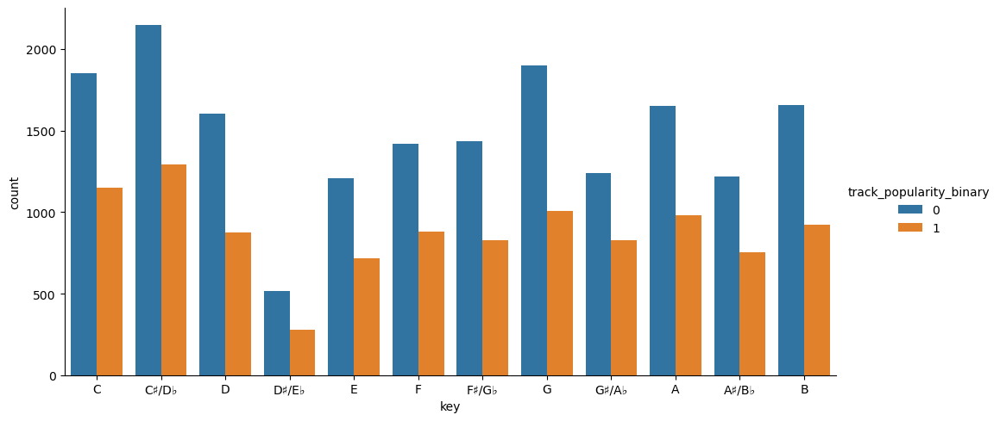

In [48]:
sns.catplot(data = df_clean, x='key', hue='track_popularity_binary', kind='count', aspect=2)

plt.show()

While some keys occur more frequently than others overall, the ratio of popular to less popular songs within each key remains fairly stable, indicating that musical key has limited influence on track popularity.

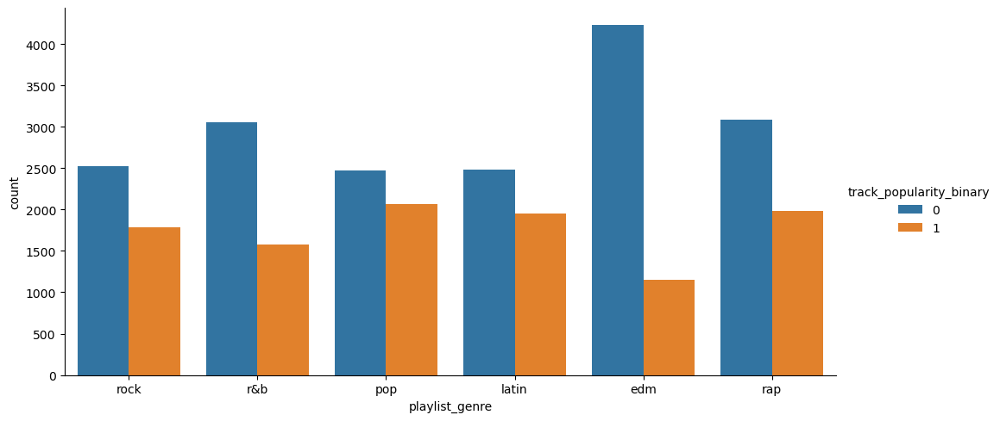

In [49]:
sns.catplot(data = df_clean, x='playlist_genre', hue='track_popularity_binary', kind='count', aspect=2)

plt.show()

`playlist_genre` shows noticeable differences in popularity, with some genres (like pop,rap, and latin) having a slightly higher share of popular songs than others.

## C. Clustering

#### Variable Selection

I will perform a cluster analysis of the 10 continuous input variables, `danceability`, `energy`, `loudness`, `speechiness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, `tempo`, and `duration_ms`

#### Notes:

* As seen in an above `Relationships between continuous variables` section, the continous variables are not heavily correlated. Due to this, I will not be performing a PCA analysis.

* **Missing values**: I dropped the missing values in the `Basic Information` section.

### Preprocessing

In [50]:
df_clean_cluster = df_clean[['danceability','energy','loudness','speechiness','acousticness',
                             'instrumentalness','liveness','valence','tempo', 'duration_ms']]

In [51]:
df_clean_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28352 entries, 0 to 28351
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      28352 non-null  float64
 1   energy            28352 non-null  float64
 2   loudness          28352 non-null  float64
 3   speechiness       28352 non-null  float64
 4   acousticness      28352 non-null  float64
 5   instrumentalness  28352 non-null  float64
 6   liveness          28352 non-null  float64
 7   valence           28352 non-null  float64
 8   tempo             28352 non-null  float64
 9   duration_ms       28352 non-null  int64  
dtypes: float64(9), int64(1)
memory usage: 2.2 MB


I will visualize the `df_clean_cluster` dataset using a boxplot.

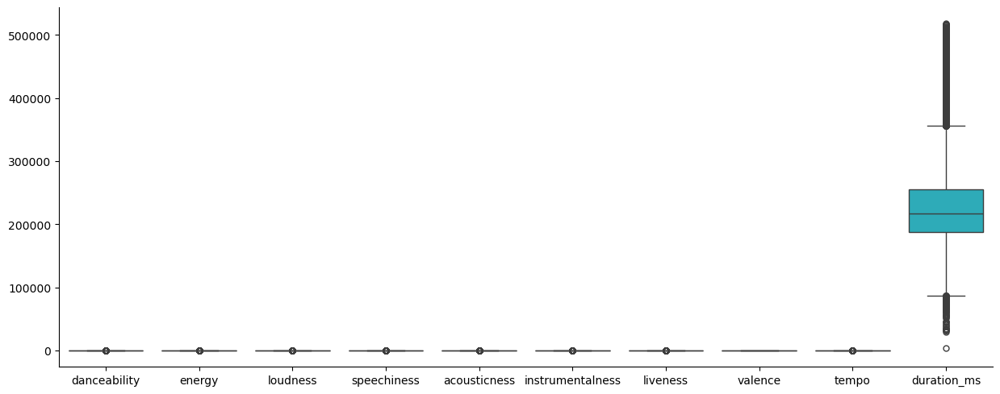

In [52]:
sns.catplot(data = df_clean_cluster, kind='box', aspect=2.5)

plt.show()

In [53]:
df_clean_cluster.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000
mean,0.653375,0.698373,-6.817777,0.107939,0.177192,0.091129,0.190955,0.510386,120.958219,226574.631102
std,0.145791,0.183508,3.036433,0.102547,0.222814,0.232562,0.155888,0.234344,26.954502,61081.363704
min,0.000000,0.000175,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,0.561000,0.579000,-8.310250,0.041000,0.014300,0.000000,0.092600,0.329000,99.972000,187741.250000
50%,0.670000,0.722000,-6.261000,0.062600,0.079700,0.000021,0.127000,0.512000,121.993500,216933.000000
75%,0.760000,0.843000,-4.708750,0.133000,0.260000,0.006573,0.249000,0.695000,133.999000,254975.250000
max,0.983000,1.000000,1.275000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


As seen above, I will need to standardize the continuous variables to bring them to bring them to the same magnitude and scale.

In [54]:
from sklearn.preprocessing import StandardScaler

In [55]:
# Standardize the input data

Xdf = StandardScaler().fit_transform(df_clean_cluster)

In [56]:
Xdf.shape

(28352, 10)

In [57]:
df_clean_cluster.shape

(28352, 10)

In [58]:
pd.DataFrame(Xdf, columns=df_clean_cluster.columns).describe().round(2)

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,28352.00,28352.00,28352.00,28352.00,28352.00,28352.00,28352.00,28352.00,28352.00,28352.00
mean,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-4.48,-3.80,-13.05,-1.05,-0.80,-0.39,-1.22,-2.18,-4.49,-3.64
25%,-0.63,-0.65,-0.49,-0.65,-0.73,-0.39,-0.63,-0.77,-0.78,-0.64
50%,0.11,0.13,0.18,-0.44,-0.44,-0.39,-0.41,0.01,0.04,-0.16
75%,0.73,0.79,0.69,0.24,0.37,-0.36,0.37,0.79,0.48,0.46
max,2.26,1.64,2.67,7.90,3.67,3.88,5.16,2.05,4.40,4.77


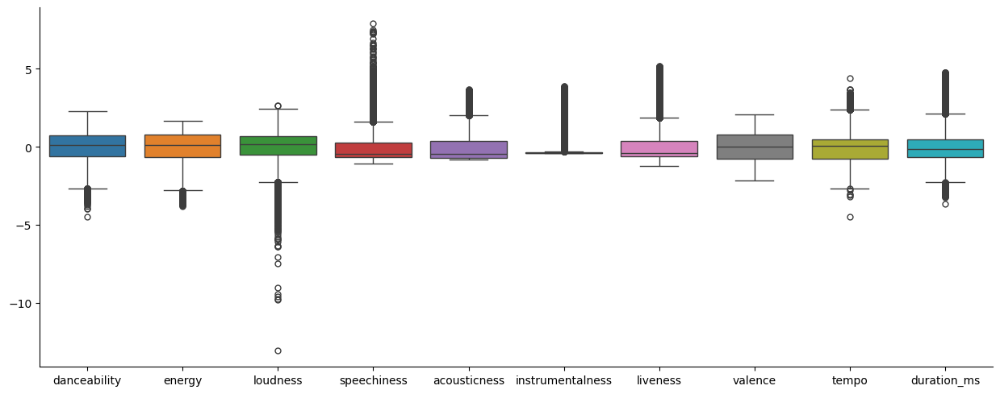

In [59]:
sns.catplot(data = pd.DataFrame(Xdf, columns=df_clean_cluster.columns), kind='box', aspect=2.5, height=5)

plt.show()

After standardization, the magnitude and scale of the input variables are fairly similar, with the exception of some extreme outliers.

`instrumentalness` is also very skewed toward zero, indicating that most tracks include vocals. I left it for completeness but it likely didn't contribute much to the cluster separation.

### KMeans: 2 Clusters

In [60]:
from sklearn.cluster import KMeans

In [61]:
# Fit, predict, and transform

clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict(Xdf)

In [62]:
clusters_2.shape

(28352,)

In [63]:
# Create a copy of the original continuous input data set

df_clean_cluster_copy = df_clean_cluster.copy()

In [64]:
# Add a column `k2` to store the result of the KMeans cluster labels

df_clean_cluster_copy['k2'] = pd.Series(clusters_2, index=df_clean_cluster.index ).astype('category')

In [65]:
# Display the number of observations per `k2` cluster

df_clean_cluster_copy.k2.value_counts()

k2
0    19965
1     8387
Name: count, dtype: int64

In [66]:
df_clean_cluster_copy.k2.value_counts(normalize=True)

k2
0    0.704183
1    0.295817
Name: proportion, dtype: float64

The K-Means clustering with k = 2 are relatively balanced with clusters containing 70% and 30% of the observations respectively. 

This kind of imbalance is expected because K-Means focuses on grouping similar songs together, not on making the groups the same size.

#### Visualize the cluster results

##### Summarize the continuous inputs associated with each of the cluster assignments.

Similar to an earlier section, I will do a pairplot for a couple different subsets: *Energy features* and *Energy acoustic features* for clearer visibility.

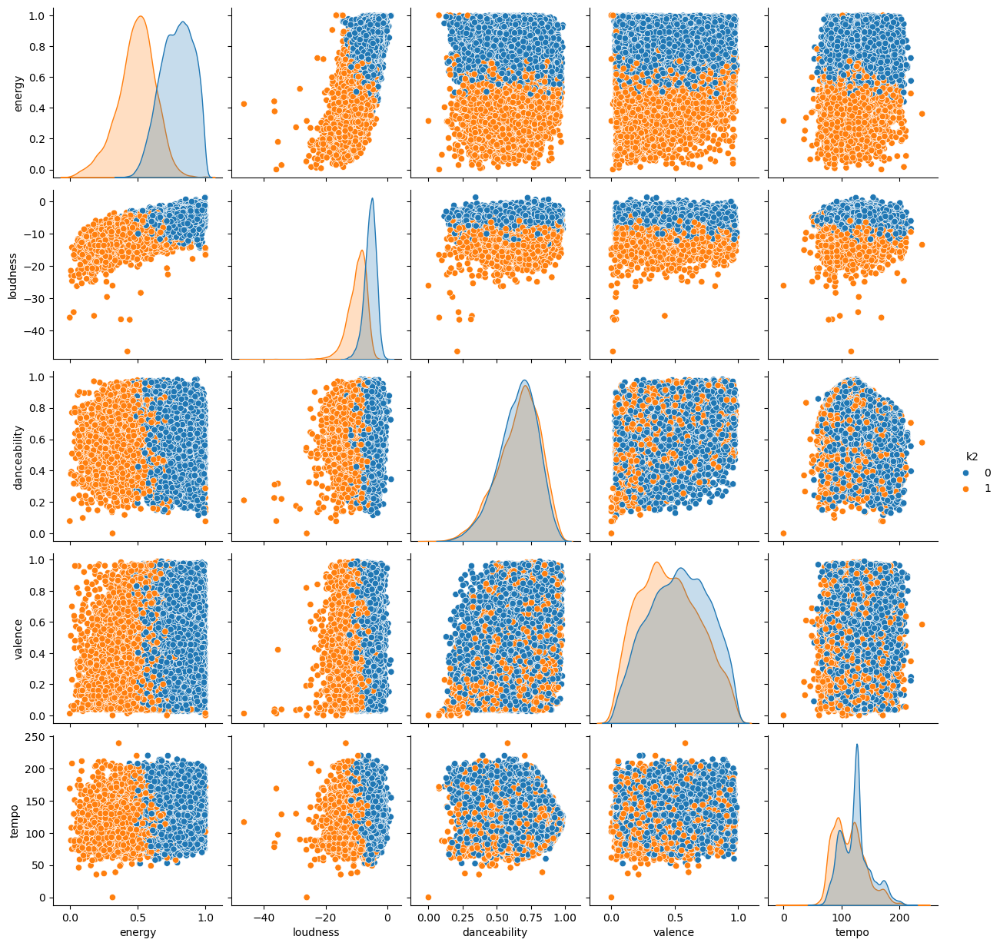

In [67]:
# Visualize the cluster results for energy features

sns.pairplot(data = df_clean_cluster_copy, x_vars = energy_features, y_vars = energy_features,
             hue='k2',
             diag_kws={'common_norm': False})

plt.show()

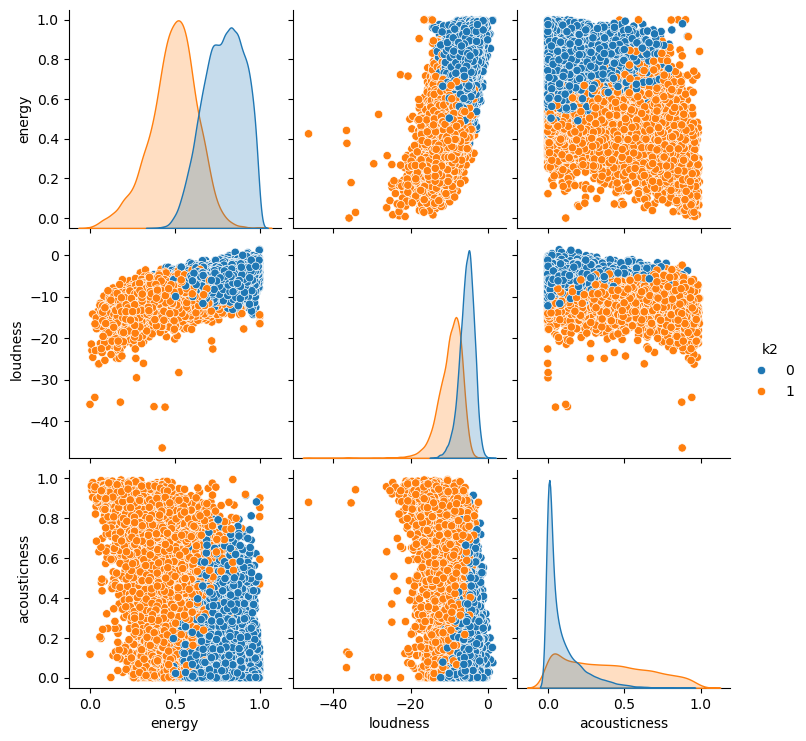

In [68]:
# Visualize the cluster results for energy acoustic features

sns.pairplot(data = df_clean_cluster_copy, x_vars = energy_acoustic_features, y_vars = energy_acoustic_features,
             hue='k2',
             diag_kws={'common_norm': False})

plt.show()

In [69]:
# Convert to long format and add a column `track_popularity_binary` for visualizations

df_clean_cluster_copy['track_popularity_binary'] = df_clean.track_popularity_binary

df_clean_cluster_copy_numeric = ['danceability','energy','loudness','speechiness','acousticness',
                                 'instrumentalness','liveness','valence','tempo', 'duration_ms']

df_clean_cluster_copy_object = ['k2', 'track_popularity_binary']

df_clean_cluster_copy_lf = df_clean_cluster_copy.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid']+df_clean_cluster_copy_object,
    value_vars=df_clean_cluster_copy_numeric)

In [70]:
len(df_clean_cluster_copy_numeric) * df_clean_cluster_copy.shape[0] == df_clean_cluster_copy_lf.shape[0]

True

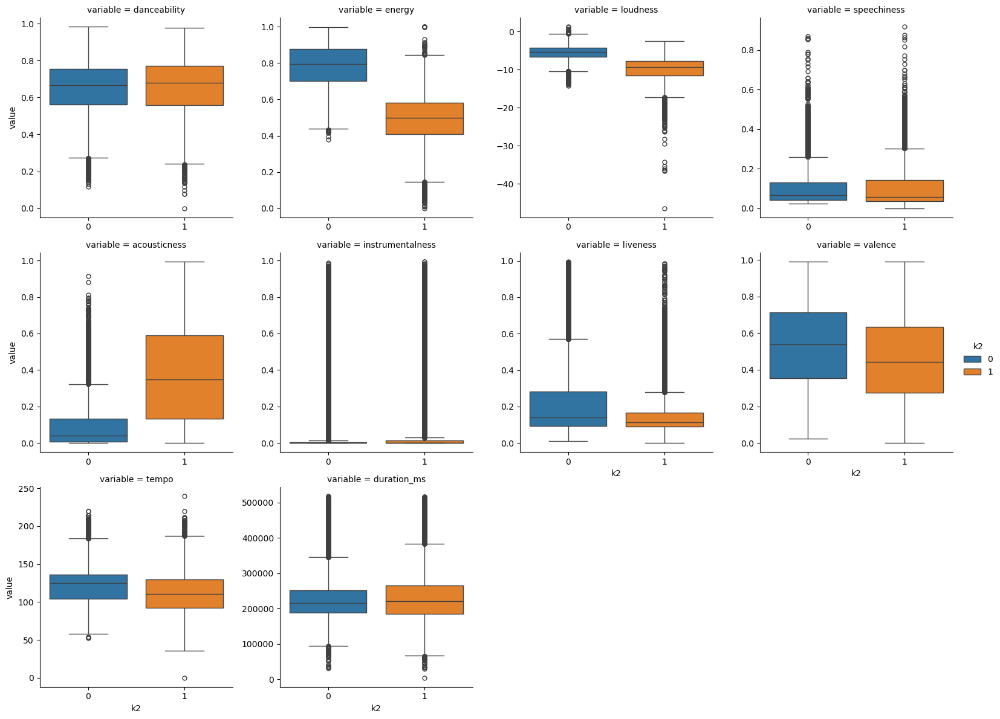

In [71]:
sns.catplot(data=df_clean_cluster_copy_lf, x='k2', y='value', col='variable', kind='box',
            col_wrap=4, height=4,
            sharex=False, sharey=False,
            hue='k2')

plt.show()

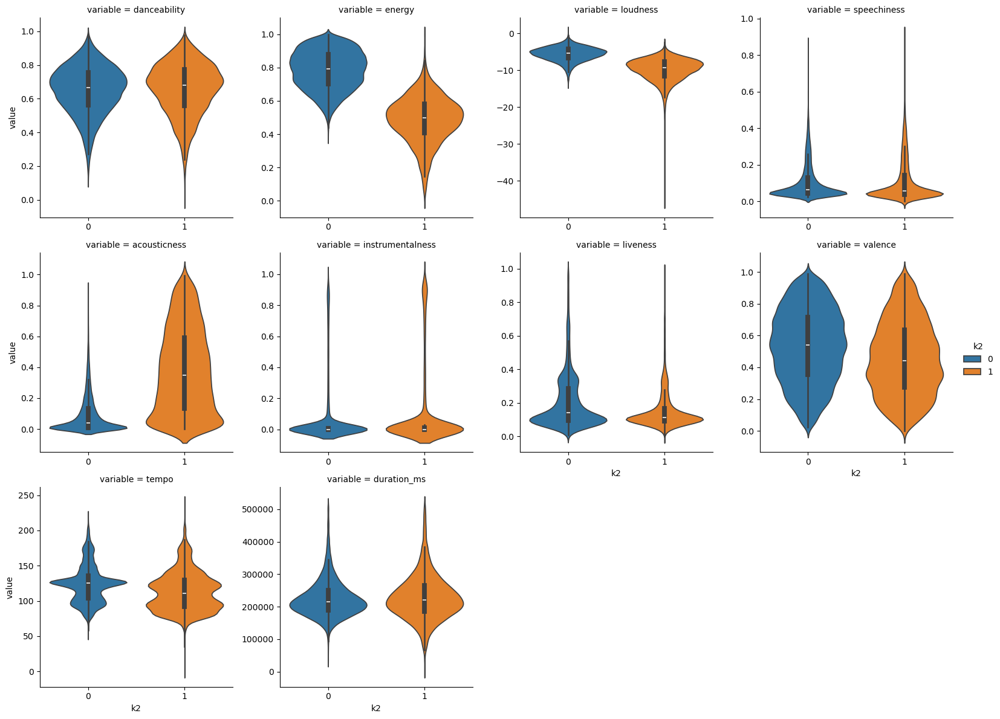

In [72]:
sns.catplot(
    data=df_clean_cluster_copy_lf, x='k2', y='value', col='variable',
    kind='violin', col_wrap=4, height=4,
    sharex=False, sharey=False,
    hue='k2', split=False)

plt.show()

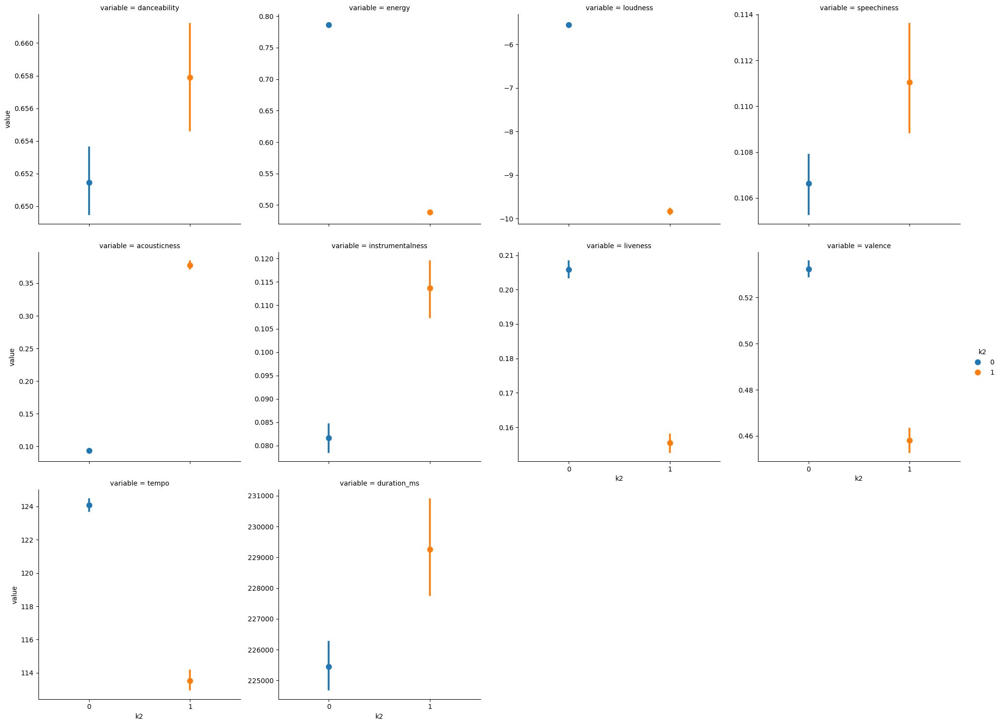

In [73]:
sns.catplot(data = df_clean_cluster_copy_lf, x='k2', y='value', col='variable', kind='point', hue='k2',
            col_wrap=4, sharey=False, join=False,)

plt.show()

Overall, the two clusters show clear differences. `Cluster 0` contains tracks that are generally `louder`, more `energetic`, more `danceable`, and less `acoustic`, while `Cluster 1` contains tracks that are quieter, lower energy, and much higher in `acousticness`. These patterns appear consistently across plot types, indicating that there is a "higher energy" group and a more "acoustic/low energy" group.

#### Compare cluster results to outcome unique variables

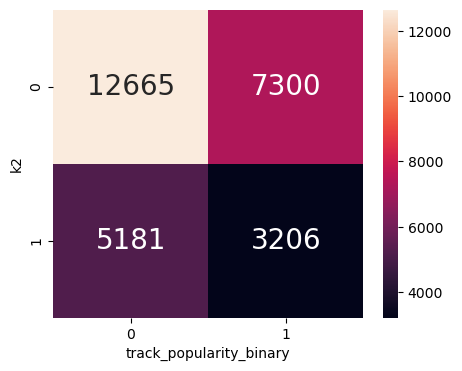

In [74]:
fig, ax = plt.subplots(figsize=(5, 4)) 

sns.heatmap(pd.crosstab(df_clean_cluster_copy.k2, df_clean.track_popularity_binary), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

The clusters contain similar amounts of popular and non-popular tracks, which suggests that the groups are based on differences in the music’s audio features, rather than a song's is popularity.

#### Compare cluster results to `playlist_genre` unique variables

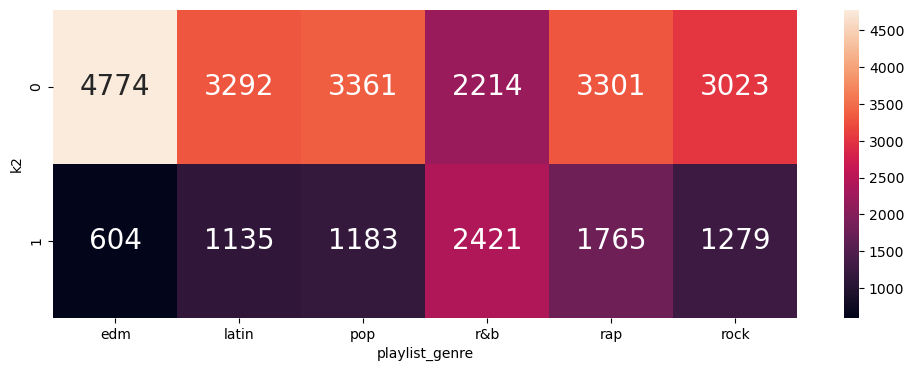

In [75]:
g, ax = plt.subplots(figsize=(12, 4)) 

sns.heatmap(pd.crosstab(df_clean_cluster_copy.k2, df_clean.playlist_genre), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

For `k=2`, `Cluster 0` includes most songs from every genre, so it represents the general “main” group of tracks. `Cluster 1` is smaller and contains more r&b, rap, and some pop songs, indicating these genres share a more distinct sound pattern that separates them from the rest.

### Identify the optimal number of clusters for Kmeans using elbow plot

The range of k = 1–10 was selected to view potential clustering count.

In [76]:
tots_within = []

K = range(1, 11)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit(Xdf)
    
    tots_within.append( km.inertia_ )

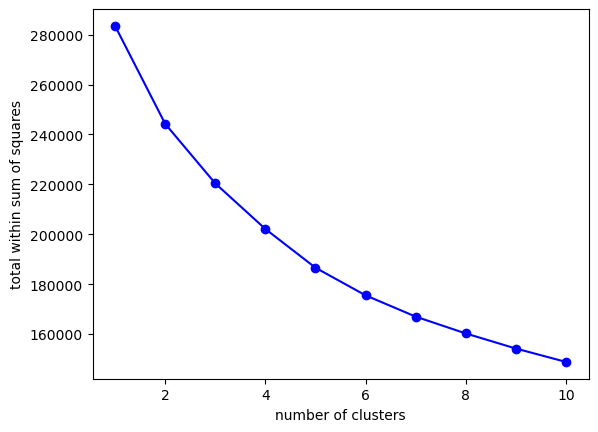

In [77]:
fig, ax = plt.subplots()

ax.plot( K, tots_within, 'bo-' )
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

The elbow plot shows a sharp drop between k = 1 and k = 3, after which the curve leveled off. This indicates diminishing improvement beyond three clusters, so k = 3 was selected.

### Identify the optimal number of clusters using a dendrogram

In [78]:
hclust_ward = hierarchy.ward(Xdf)

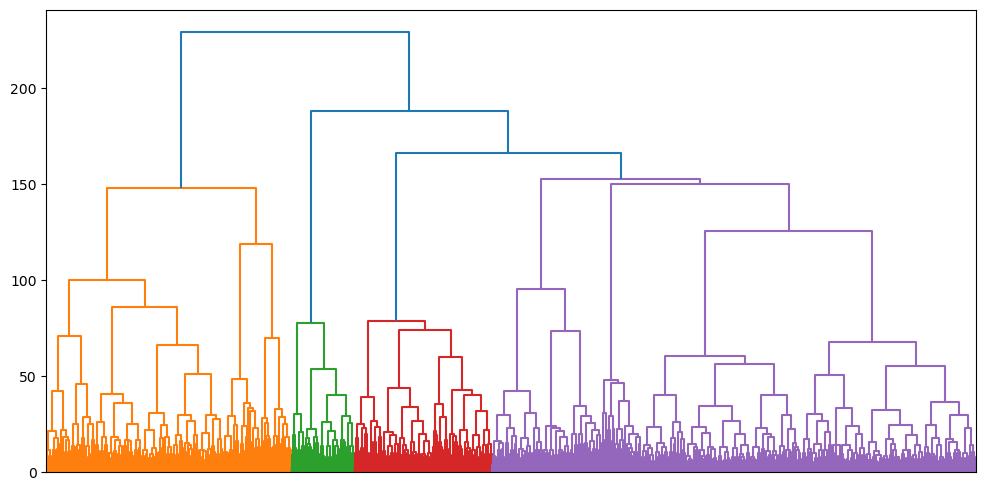

In [79]:
fig = plt.figure(figsize=(12, 6))

dn = hierarchy.dendrogram(hclust_ward, no_labels=True)

plt.show()

The Ward dendrogram revealed three main branches before a large jump in linkage distance, suggesting a natural division into three groups. This supports the k = 3 result from the elbow method.

### KMeans: 3 Clusters

In [80]:
# Fit, predict, and transform

clusters_3 = KMeans(n_clusters=3, random_state=121, n_init=25, max_iter=500).fit_predict(Xdf)

In [81]:
# Add a column `k3` to store the result of the KMeans cluster labels

df_clean_cluster_copy['k3'] = pd.Series(clusters_3, index=df_clean_cluster.index ).astype('category')

In [82]:
# Display the number of observations per `k3` cluster

df_clean_cluster_copy.k3.value_counts()

k3
2    13047
0    10067
1     5238
Name: count, dtype: int64

In [83]:
df_clean_cluster_copy.k3.value_counts(normalize=True)

k3
2    0.460179
0    0.355072
1    0.184749
Name: proportion, dtype: float64

The k3 clusters are more balanced than the k2 clusters.

#### Visualize the cluster results

##### Summarize the continuous inputs associated with each of the cluster assignments.

Similar to an earlier sections, I will do a pairplot for a couple different subsets: *Energy features* and *Energy acoustic features* for clearer visibility.

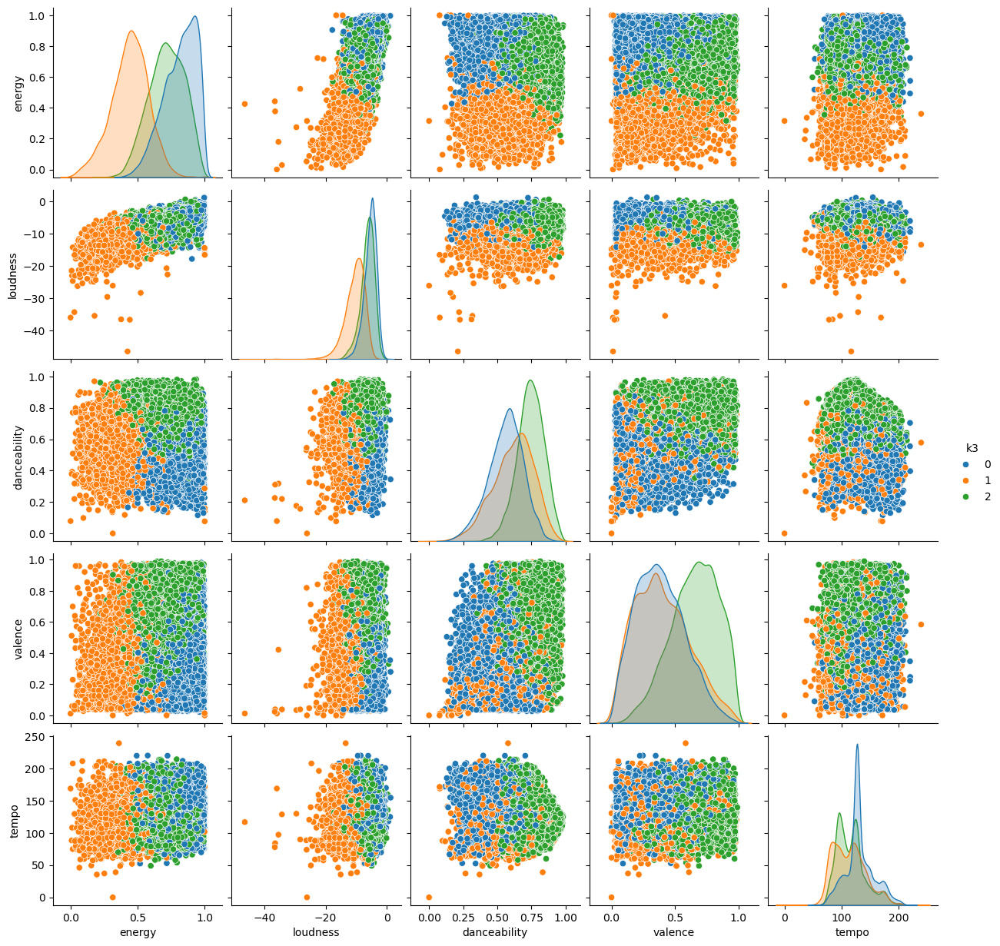

In [84]:
# Visualize the cluster results for energy features

sns.pairplot(data = df_clean_cluster_copy, x_vars = energy_features, y_vars = energy_features,
             hue='k3',
             diag_kws={'common_norm': False})

plt.show()

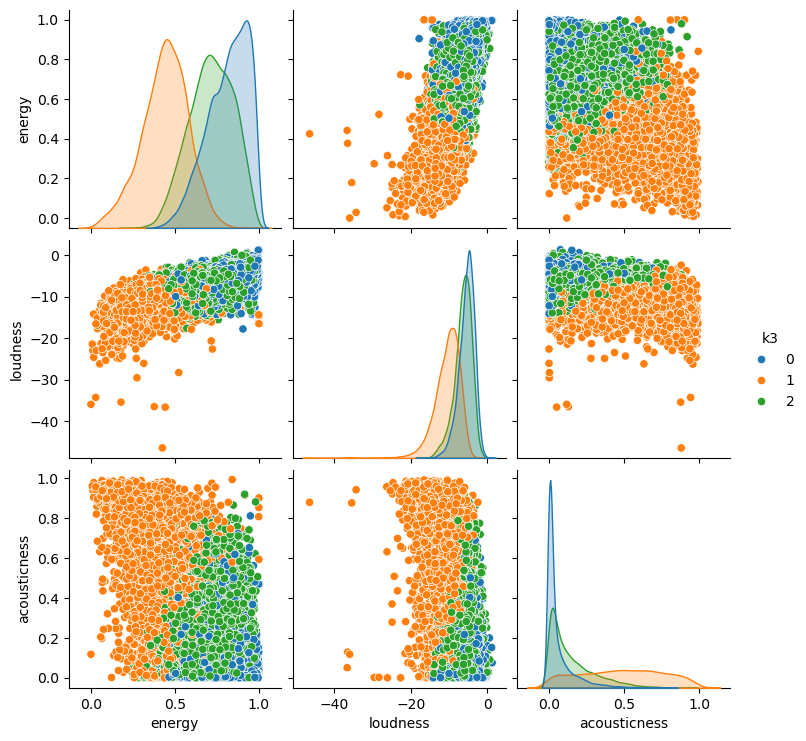

In [85]:
# Visualize the cluster results for energy acoustic features

sns.pairplot(data = df_clean_cluster_copy, x_vars = energy_acoustic_features, y_vars = energy_acoustic_features,
             hue='k3',
             diag_kws={'common_norm': False})

plt.show()

In [86]:
# Convert to long format and add a column `track_popularity_binary` or visualizations

df_clean_cluster_copy_object = ['k2', 'k3', 'track_popularity_binary']

df_clean_cluster_copy_lf = (df_clean_cluster_copy.reset_index()\
                            .rename(columns={'index': 'rowid'})\
                            .melt(id_vars=['rowid'] + df_clean_cluster_copy_object, value_vars=df_clean_cluster_copy_numeric))

In [87]:
len(df_clean_cluster_copy_numeric) * df_clean_cluster_copy.shape[0] == df_clean_cluster_copy_lf.shape[0]

True

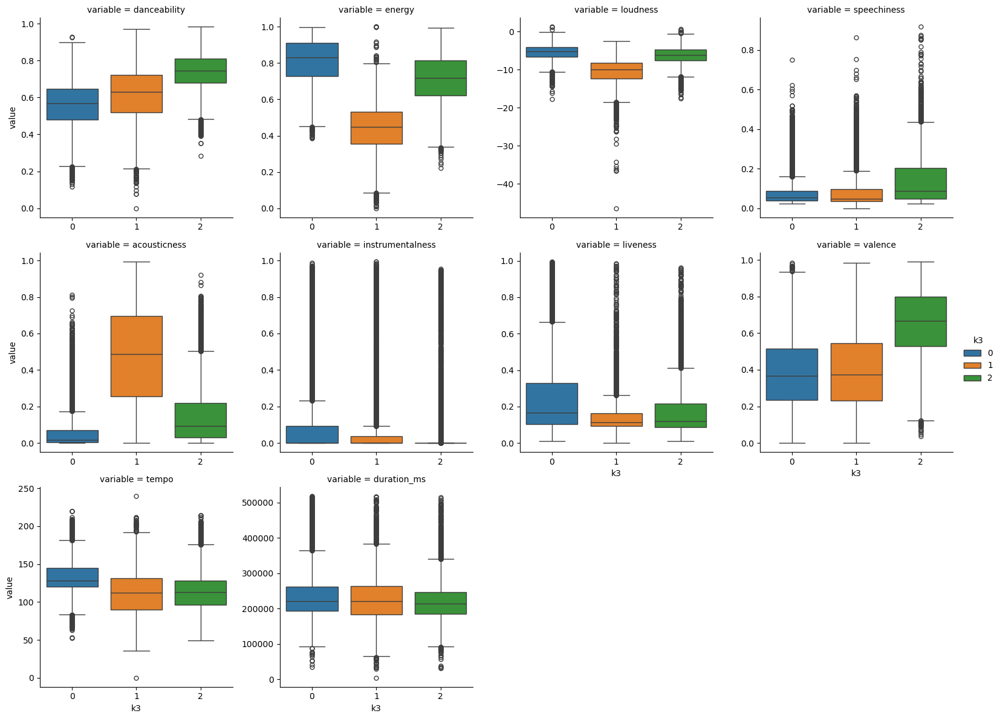

In [88]:
sns.catplot(data=df_clean_cluster_copy_lf, x='k3', y='value', col='variable', kind='box',
            col_wrap=4, height=4,
            sharex=False, sharey=False,
            hue='k3')

plt.show()

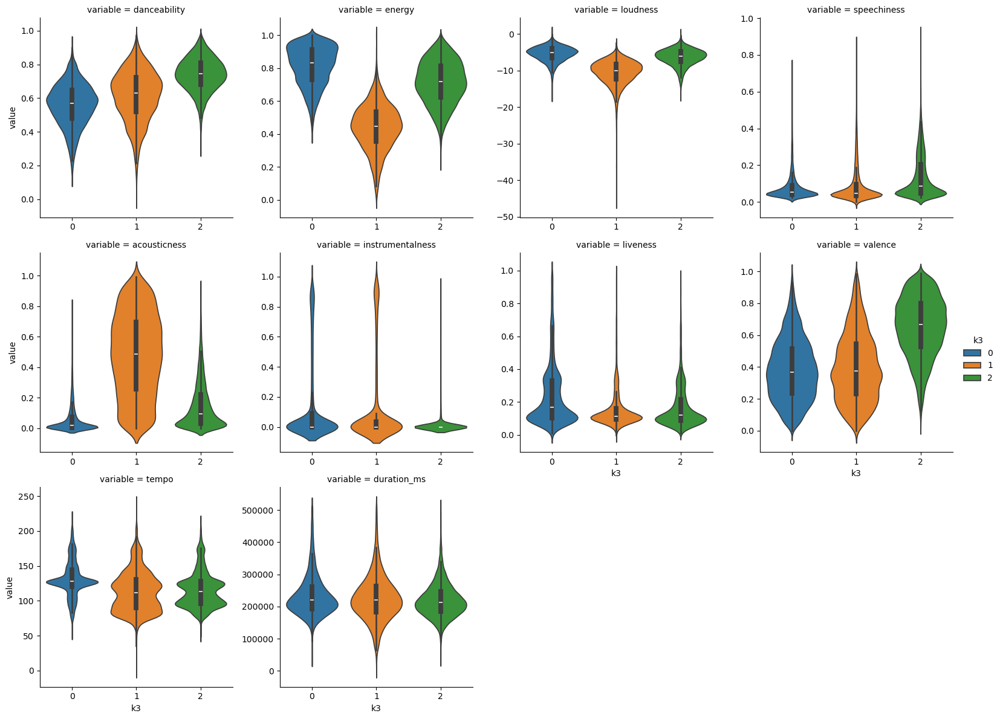

In [89]:
sns.catplot(
    data=df_clean_cluster_copy_lf, x='k3', y='value', col='variable',
    kind='violin', col_wrap=4, height=4,
    sharex=False, sharey=False,
    hue='k3', split=False)

plt.show()

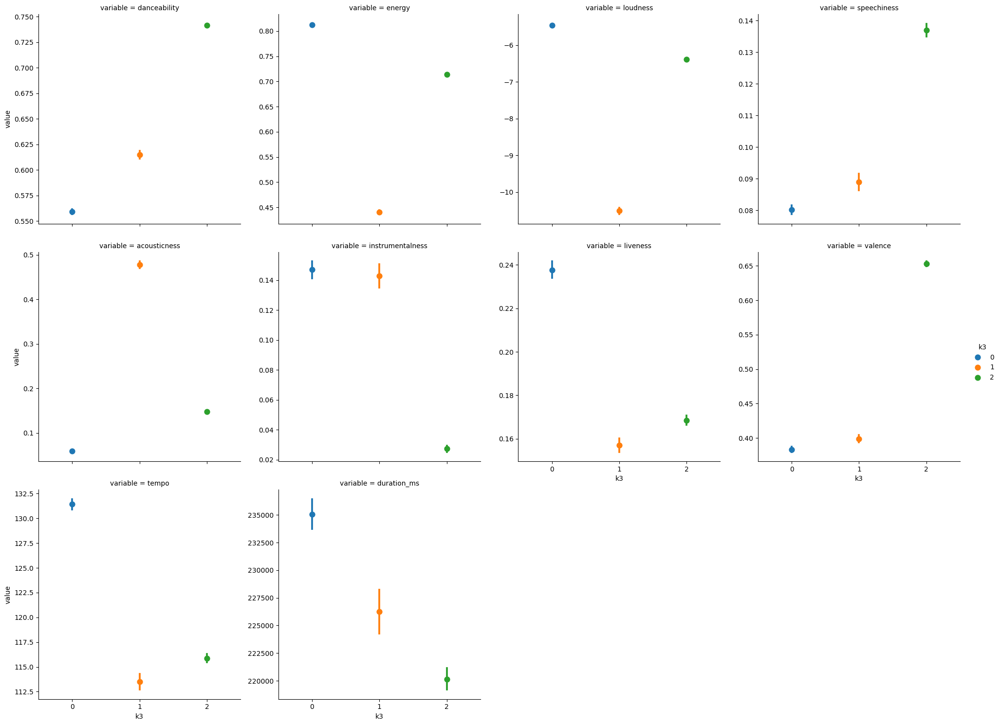

In [90]:
sns.catplot(data = df_clean_cluster_copy_lf, x='k3', y='value', col='variable', kind='point', hue='k3',
            col_wrap=4, sharey=False, join=False,)

plt.show()

The three clusters capture more distinct groups of songs than `k=2`: 
* `Cluster 0` groups together high-energy, loud tracks with faster tempos
* `Cluster 1` contains softer, more acoustic songs with lower energy
* `Cluster 2` represents a middle group with moderate energy, higher valence, and generally more balanced audio features.

#### Compare cluster results to outcome unique variables

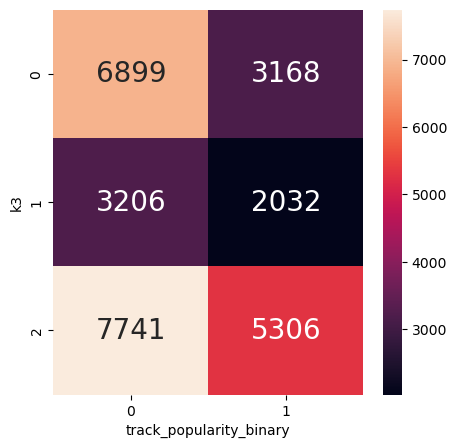

In [91]:
fig, ax = plt.subplots(figsize=(5, 5)) 

sns.heatmap(pd.crosstab(df_clean_cluster_copy.k3, df_clean.track_popularity_binary), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

Similar to `k=2`, the `k=3` clusters don’t line up with popularity levels, which indicates that the clustering is grouping songs based on their musical characteristics, not whether they are popular.

#### Compare cluster results to `playlist_genre` unique variables

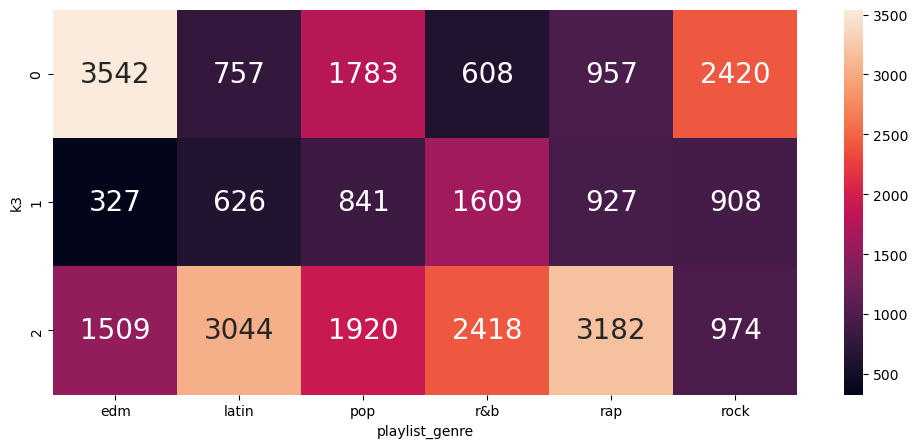

In [92]:
g, ax = plt.subplots(figsize=(12, 5)) 

sns.heatmap(pd.crosstab(df_clean_cluster_copy.k3, df_clean.playlist_genre), ax=ax,
    annot=True, annot_kws={'size': 20}, fmt='d')

plt.show()

For `k=3`, the genres separate more clearly: `Cluster 0` has more edm and rock, `Cluster 2` has more latin and rap, and `Cluster 1` has more r&b. This suggests that three clusters do a better job capturing different musical styles based on the audio features.

## D. Models: Fitting and Interpretation

### Preprocessing

I went through preprocessing steps in part D again for predictive modeling.

In [93]:
# Build transformed copy for modeling

df_mod = df_clean.copy()

The EDA section revealed that several continuous variables (`speechiness`, `acousticness`, `instrumentalness`, and `liveness`) were highly right-skewed, while others like `danceability`, `energy`, and `valence` were roughly symmetric. To improve model stability, I applied natural log transformations to the skewed features.

I applied `np.log1p()` to variables that include zeros because the standard log can’t handle zero values, and used a regular `log` only for `duration_ms` since it’s always positive.

In [94]:
# Natural log transformation for skewed continuous variables

for c in ['speechiness','acousticness','instrumentalness','liveness']:
    df_mod[c + '_t'] = np.log1p(df_mod[c])

df_mod['duration_ms_t'] = np.log(df_mod['duration_ms'])

In [95]:
# Continous variables to standardize

df_mod_X_cont = ['danceability','energy','valence','tempo','loudness']\
 + [c+'_t' for c in ['speechiness','acousticness','instrumentalness','liveness','duration_ms']]

# Categorical variables

df_mod_X_cat = ['playlist_genre','key','mode']

# Output variable

df_mod_y = 'track_popularity_binary'

All continuous variables were standardized to ensure comparable scales before modeling.

In [96]:
# Standardize continuous variables

scaler = StandardScaler().fit(df_mod[df_mod_X_cont])
df_mod_standardized = df_mod.copy()
df_mod_standardized[df_mod_X_cont] = scaler.transform(df_mod[df_mod_X_cont])

In [97]:
# Build compact modeling dataset

model_cols = df_mod_X_cont + df_mod_X_cat + [df_mod_y]

df_model = df_mod_standardized[model_cols].copy()

### Functions for Interpreting Models

In [106]:
# Define a function that fits and calculates the training set performance for any formula
from sklearn.metrics import precision_score, f1_score
def fit_and_assess_logistic(mod_name, a_formula, train_data, threshold):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()
    
    train_copy = train_data.copy()
    train_copy['pred_probability'] = a_mod.predict(train_data)
    train_copy['pred_class'] = np.where(train_copy.pred_probability > threshold, 1, 0)
    
    TN, FP, FN, TP = confusion_matrix(train_copy.y.to_numpy(), train_copy.pred_class.to_numpy()).ravel()
    
    Accuracy = (TN + TP) / (TN + FP + FN + TP)
    Sensitivity = (TP) / (TP + FN) if (TP+FN)>0 else np.nan
    Specificity = (TN) / (TN + FP) if (TN+FP)>0 else np.nan
    FPR = 1 - Specificity if not np.isnan(Specificity) else np.nan
    ROC_AUC = roc_auc_score(train_copy.y.to_numpy(), train_copy.pred_probability.to_numpy())
    Precision = precision_score(train_copy.y.to_numpy(), train_copy.pred_class.to_numpy())
    F1 = f1_score(train_copy.y.to_numpy(), train_copy.pred_class.to_numpy())
    
    res_dict = {'model_name': mod_name,
                'model_formula': a_formula,
                'num_coefs': len(a_mod.params),
                'threshold': threshold,
                'Accuracy': Accuracy,
                'Sensitivity': Sensitivity,
                'Specificity': Specificity,
                'FPR': FPR,
                'ROC_AUC': ROC_AUC,
                'Precision:': Precision,
                'F1': F1   }
    
    return pd.DataFrame(res_dict, index=[0])

In [107]:
# Define a function that displays a coefficient plot given a particular model

def my_coefplot(mod, figsize_use=(8, 6)):   # smaller figure size
    fig, ax = plt.subplots(figsize=figsize_use)
    ax.errorbar(y=mod.params.index,
                x=mod.params,
                xerr=2 * mod.bse,
                fmt='o', color='k', ecolor='k', elinewidth=1.5, ms=6)
    ax.axvline(x=0, linestyle='--', linewidth=2, color='grey')
    ax.set_xlabel('Coefficient Value')
    ax.set_ylabel('Feature')
    plt.tight_layout()
    plt.show()

In [108]:
# Define a function that returns the complete ROC curve for each model

def fit_logistic_make_roc(mod_name, a_formula, train_data):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()
    train_copy = train_data.copy()
    train_copy['pred_probability'] = a_mod.predict(train_data)
    fpr, tpr, threshold = roc_curve(train_data.y.to_numpy(), train_copy.pred_probability.to_numpy())
    res_df = pd.DataFrame({'tpr': tpr, 'fpr': fpr, 'threshold': threshold})
    res_df['model_name'] = mod_name
    res_df['model_formula'] = a_formula
    return res_df

In [109]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [110]:
# List to hold performance results
results_list = []

# List for ROC visualization
roc_list = []

In [111]:
df_model_copy = df_model.copy()

In [112]:
df_model_copy = df_model_copy.rename(columns={'track_popularity_binary': 'y'})

### Fitting Logistic Regression Models

#### Model 1

In [113]:
# Model 1: Constant
results_list.append(fit_and_assess_logistic(1, 'y ~ 1', train_data=df_model_copy, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(1, 'y ~ 1', train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.659251
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.659251
         Iterations 4


In [114]:
# Fit model 1
fit_1 = smf.logit(formula='y ~ 1', data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.659251
         Iterations 4


In [115]:
# How many coefficients were estimated?
len(fit_1.params)

1

In [116]:
# How many coefficients are statsically significant?
sum(fit_1.pvalues < 0.05)

1

1 coefficient is statistically significant, and is negative. 

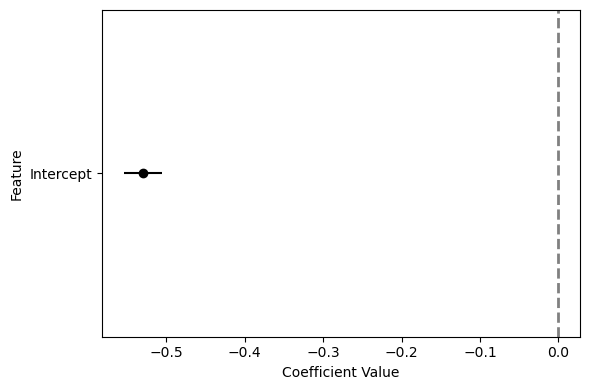

In [117]:
my_coefplot(fit_1, figsize_use=(6, 4))

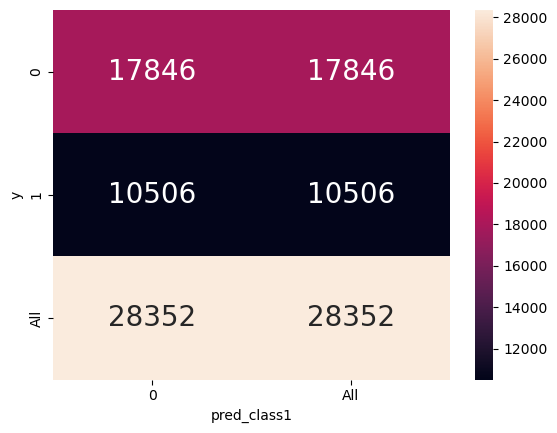

In [118]:
# Confusion heatmap
cm_df = df_model_copy.copy()

cm_df['pred_probability1'] = fit_1.predict(df_model_copy)
cm_df['pred_class1'] = np.where(cm_df.pred_probability1 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class1, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 2

In [119]:
# Model 2: Categorical additive features
cat_terms = 'C(playlist_genre) + C(key) + C(mode)'
formula_2 = f'y ~ {cat_terms}'

results_list.append(fit_and_assess_logistic(2, formula_2, train_data=df_model_copy, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(2, formula_2, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.642769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642769
         Iterations 5


In [120]:
# Fit model 2
fit_2 = smf.logit(formula=formula_2, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.642769
         Iterations 5


In [121]:
# How many coefficients were estimated?
len(fit_2.params)

18

In [122]:
# How many coefficients are statsically significant?
sum(fit_2.pvalues < 0.05)

9

In [123]:
# Which two statistically significant coefficients have the highest magnitude coefficient values? (excluding intercept)
display(fit_2.params[fit_2.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['C(playlist_genre)[T.pop]', 'C(playlist_genre)[T.latin]'], dtype='object')

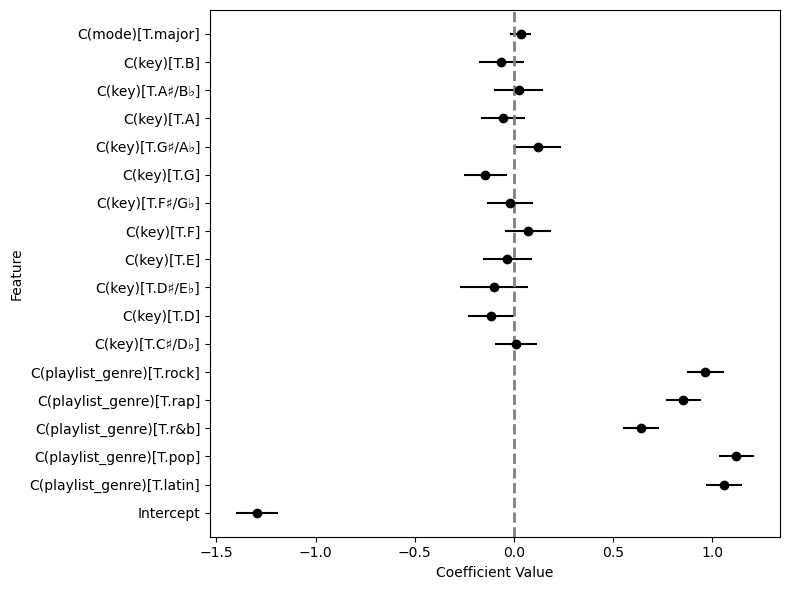

In [124]:
# Postitive and negative features for coefficients, including those that are statistically significant 
my_coefplot(fit_2)

In [125]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_2.params[fit_2.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('C(playlist_genre)[T.latin]', 'positive'),
 ('C(playlist_genre)[T.pop]', 'positive'),
 ('C(playlist_genre)[T.r&b]', 'positive'),
 ('C(playlist_genre)[T.rap]', 'positive'),
 ('C(playlist_genre)[T.rock]', 'positive'),
 ('C(key)[T.D]', 'negative'),
 ('C(key)[T.G]', 'negative'),
 ('C(key)[T.G♯/A♭]', 'positive')]

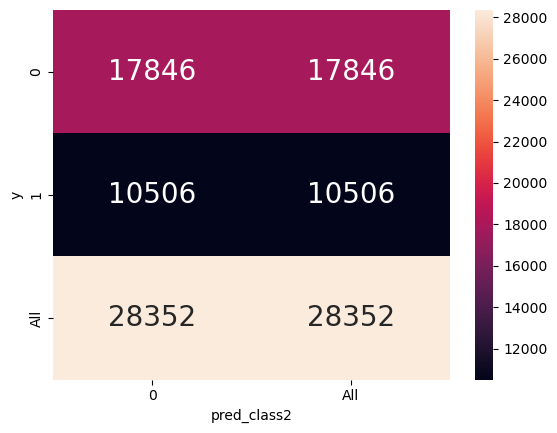

In [126]:
# Confusion heatmap
cm_df['pred_probability2'] = fit_2.predict(df_model_copy)
cm_df['pred_class2'] = np.where(cm_df.pred_probability2 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class2, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 3

In [127]:
# Model 3: Continuous additive features
cont_terms = 'danceability + energy + valence + tempo + loudness + speechiness_t + acousticness_t + instrumentalness_t + liveness_t + duration_ms_t'
formula_3 = f'y ~ {cont_terms}'

results_list.append(fit_and_assess_logistic(3, formula_3, train_data=df_model_copy, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(3, formula_3, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.638318
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638318
         Iterations 5


In [128]:
# Fit model 3
fit_3 = smf.logit(formula=formula_3, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.638318
         Iterations 5


In [129]:
# How many coefficients were estimated?
len(fit_3.params)

11

In [130]:
# How many coefficients are statsically significant?
sum(fit_3.pvalues < 0.05)

10

In [131]:
# Which two statistically significant coefficients have the highest magnitude coefficient values? (excluding intercept)
display(fit_3.params[fit_3.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['energy', 'loudness'], dtype='object')

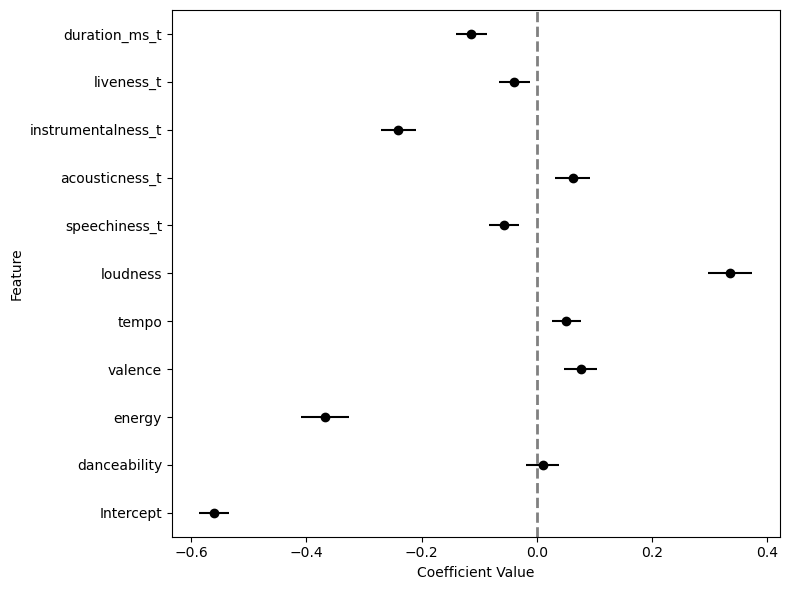

In [132]:
# Postitive and negative features for coefficients, including those that are statistically significant 
my_coefplot(fit_3)

In [133]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_3.params[fit_3.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('energy', 'negative'),
 ('valence', 'positive'),
 ('tempo', 'positive'),
 ('loudness', 'positive'),
 ('speechiness_t', 'negative'),
 ('acousticness_t', 'positive'),
 ('instrumentalness_t', 'negative'),
 ('liveness_t', 'negative'),
 ('duration_ms_t', 'negative')]

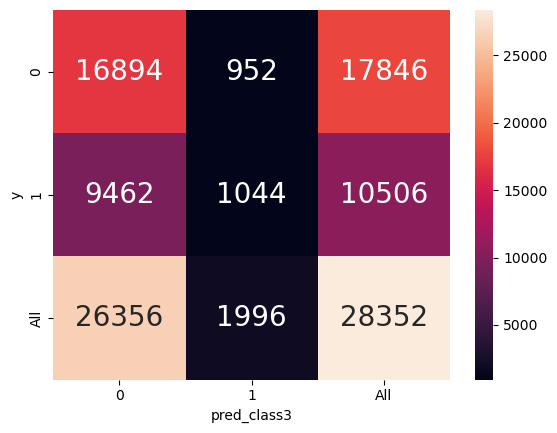

In [134]:
# Confusion heatmap
cm_df['pred_probability3'] = fit_3.predict(df_model_copy)
cm_df['pred_class3'] = np.where(cm_df.pred_probability3 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class3, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 4

In [135]:
# Model 4: All inputs with linear additive features
cat_cont_terms = f'{cat_terms} + {cont_terms}'
formula_4 = f'y ~ {cat_cont_terms}'

results_list.append(fit_and_assess_logistic(4, formula_4, train_data=df_model_copy, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(4, formula_4, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.625208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625208
         Iterations 5


In [136]:
# Fit model 4
fit_4 = smf.logit(formula=formula_4, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.625208
         Iterations 5


In [137]:
# How many coefficients were estimated?
len(fit_4.params)

28

In [138]:
# How many coefficients are statsically significant?
sum(fit_4.pvalues < 0.05)

14

In [139]:
# Which two statistically significant coefficients have the highest magnitude coefficient values (excluding intercept)
display(fit_4.params[fit_4.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['C(playlist_genre)[T.rock]', 'C(playlist_genre)[T.pop]'], dtype='object')

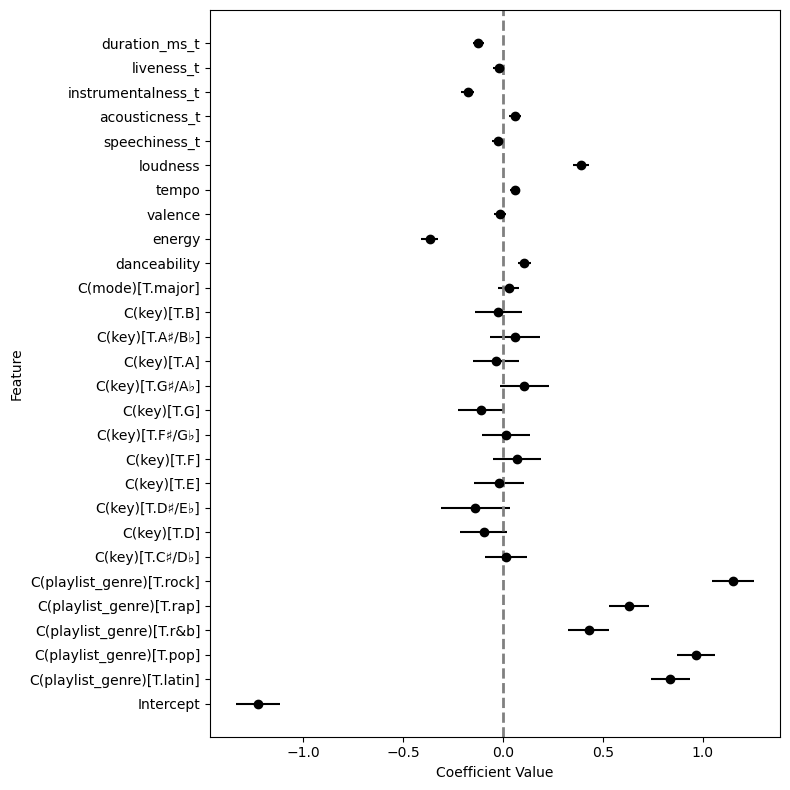

In [140]:
# Postitive and negative features for coefficients, including those that are statistically significant 
my_coefplot(fit_4, figsize_use=(8, 8))

In [141]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_4.params[fit_4.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('C(playlist_genre)[T.latin]', 'positive'),
 ('C(playlist_genre)[T.pop]', 'positive'),
 ('C(playlist_genre)[T.r&b]', 'positive'),
 ('C(playlist_genre)[T.rap]', 'positive'),
 ('C(playlist_genre)[T.rock]', 'positive'),
 ('C(key)[T.G]', 'negative'),
 ('danceability', 'positive'),
 ('energy', 'negative'),
 ('tempo', 'positive'),
 ('loudness', 'positive'),
 ('acousticness_t', 'positive'),
 ('instrumentalness_t', 'negative'),
 ('duration_ms_t', 'negative')]

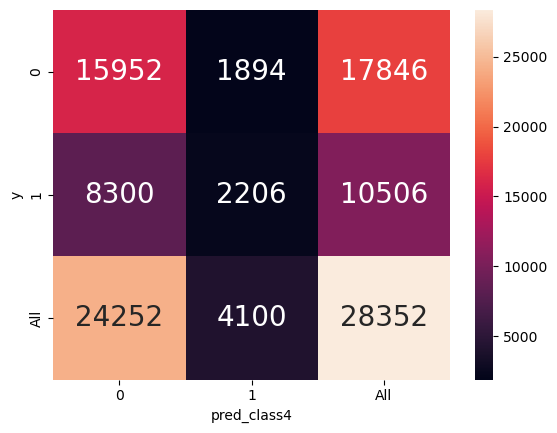

In [142]:
# Confusion heatmap
cm_df['pred_probability4'] = fit_4.predict(df_model_copy)
cm_df['pred_class4'] = np.where(cm_df.pred_probability4 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class4, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 5

In [143]:
# Model 5: Continuous inputs with linear main effect and pair-wise interactions
cont_sum = cont_terms
formula_5 = f'y ~ ({cont_sum})**2'

results_list.append(fit_and_assess_logistic(5, formula_5, train_data=df_model_copy, threshold=0.5))
roc_list.append(fit_logistic_make_roc(5, formula_5, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.629853
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629853
         Iterations 6


In [144]:
# Fit model 5
fit_5 = smf.logit(formula=formula_5, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.629853
         Iterations 6


In [145]:
# How many coefficients were estimated?
len(fit_5.params)

56

In [146]:
# How many coefficients are statsically significant?
sum(fit_5.pvalues < 0.05)

28

In [147]:
# Which two statistically significant coefficients have the highest magnitude coefficient values (excluding intercept)
display(fit_5.params[fit_5.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['energy', 'loudness'], dtype='object')

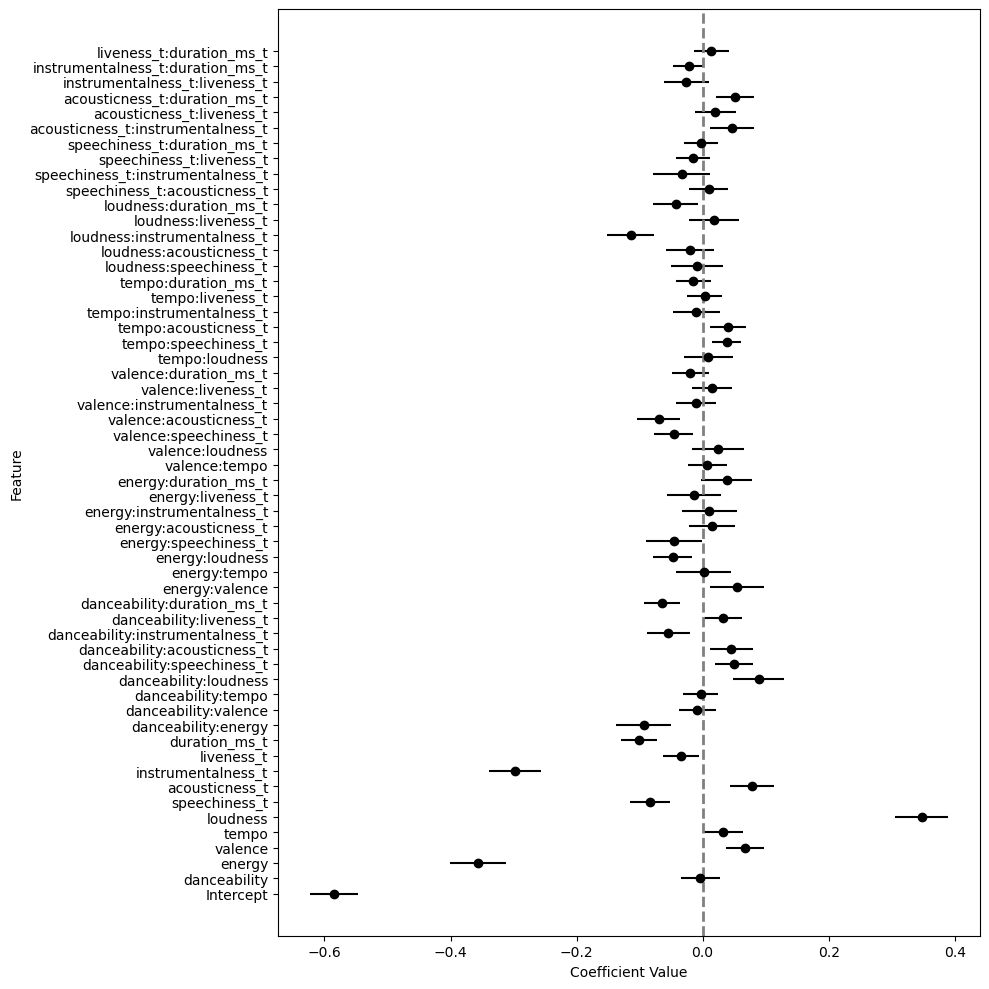

In [148]:
# Postitive and negative features for coefficients, including those that are statistically significant 
my_coefplot(fit_5, figsize_use=(10, 10))

In [149]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_5.params[fit_5.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('energy', 'negative'),
 ('valence', 'positive'),
 ('tempo', 'positive'),
 ('loudness', 'positive'),
 ('speechiness_t', 'negative'),
 ('acousticness_t', 'positive'),
 ('instrumentalness_t', 'negative'),
 ('liveness_t', 'negative'),
 ('duration_ms_t', 'negative'),
 ('danceability:energy', 'negative'),
 ('danceability:loudness', 'positive'),
 ('danceability:speechiness_t', 'positive'),
 ('danceability:acousticness_t', 'positive'),
 ('danceability:instrumentalness_t', 'negative'),
 ('danceability:liveness_t', 'positive'),
 ('danceability:duration_ms_t', 'negative'),
 ('energy:valence', 'positive'),
 ('energy:loudness', 'negative'),
 ('energy:speechiness_t', 'negative'),
 ('valence:speechiness_t', 'negative'),
 ('valence:acousticness_t', 'negative'),
 ('tempo:speechiness_t', 'positive'),
 ('tempo:acousticness_t', 'positive'),
 ('loudness:instrumentalness_t', 'negative'),
 ('loudness:duration_ms_t', 'negative'),
 ('acousticness_t:instrumentalness_t', 'positive')

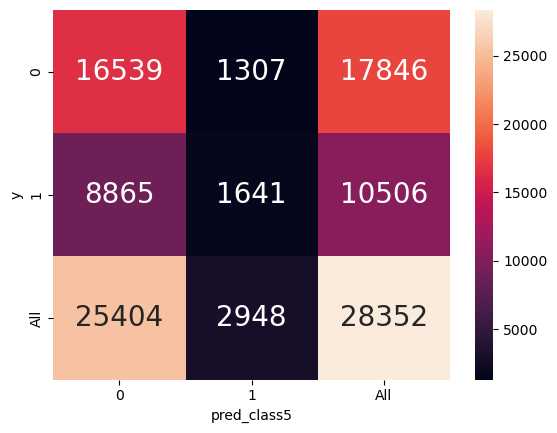

In [150]:
# Confusion heatmap
cm_df['pred_probability5'] = fit_5.predict(df_model_copy)
cm_df['pred_class5'] = np.where(cm_df.pred_probability5 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class5, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 6

In [151]:
# Model 6: All linear main effects and interactions between categorical and continuous variables
formula_6 = f'y ~ ({cat_terms}) * ({cont_terms})'

results_list.append(fit_and_assess_logistic(6, formula_6, train_data=df_model_copy, threshold=0.5))
roc_list.append(fit_logistic_make_roc(6, formula_6, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.614799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.614799
         Iterations 6


In [152]:
# Fit model 6
fit_6 = smf.logit(formula=formula_6, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.614799
         Iterations 6


In [153]:
# How many coefficients were estimated?
len(fit_6.params)

198

In [154]:
# How many coefficients are statsically significant?
sum(fit_6.pvalues < 0.05)

47

In [155]:
# Which two statistically significant coefficients have the highest magnitude coefficient values (excluding intercept)
display(fit_6.params[fit_6.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['C(playlist_genre)[T.pop]', 'C(playlist_genre)[T.rock]'], dtype='object')

Model 6 includes nearly 200 coefficients and extensive interaction terms, making the coefficient plot unreadable. Therefore, only the statistically significant variables and their coefficient signs are listed here for clarity.

In [156]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_6.params[fit_6.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('C(playlist_genre)[T.latin]', 'positive'),
 ('C(playlist_genre)[T.pop]', 'positive'),
 ('C(playlist_genre)[T.r&b]', 'positive'),
 ('C(playlist_genre)[T.rap]', 'positive'),
 ('C(playlist_genre)[T.rock]', 'positive'),
 ('C(key)[T.G]', 'negative'),
 ('C(playlist_genre)[T.latin]:danceability', 'positive'),
 ('C(playlist_genre)[T.pop]:danceability', 'positive'),
 ('C(playlist_genre)[T.r&b]:danceability', 'positive'),
 ('C(playlist_genre)[T.rap]:danceability', 'positive'),
 ('energy', 'negative'),
 ('C(playlist_genre)[T.rock]:energy', 'positive'),
 ('C(key)[T.E]:energy', 'positive'),
 ('C(key)[T.F♯/G♭]:energy', 'positive'),
 ('C(key)[T.A♯/B♭]:energy', 'positive'),
 ('C(playlist_genre)[T.r&b]:valence', 'negative'),
 ('C(playlist_genre)[T.rap]:valence', 'negative'),
 ('loudness', 'positive'),
 ('C(playlist_genre)[T.latin]:loudness', 'positive'),
 ('C(playlist_genre)[T.rap]:loudness', 'negative'),
 ('C(playlist_genre)[T.rock]:loudness', 'negative'),
 ('C(key)[T.D♯/

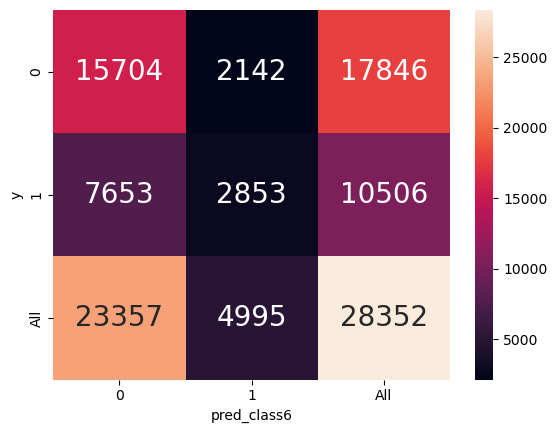

In [157]:
# Confusion heatmap
cm_df['pred_probability6'] = fit_6.predict(df_model_copy)
cm_df['pred_class6'] = np.where(cm_df.pred_probability6 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class6, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 7

This model adds quadratic terms (x²) for all continuous variables, alongside their linear mains and categorical variables.  

I chose this model to test whether simple polynomial curvature improves classification compared to purely linear models.

In [158]:
# Model 7: Nonlinear curvature for continuous variables and all linear main effects
quad_terms = ' + '.join([f'np.power({c}, 2)' for c in df_mod_X_cont])

formula_7 = f'y ~ {cat_terms} + {cont_terms} + {quad_terms}'

results_list.append(fit_and_assess_logistic(7, formula_7, train_data=df_model_copy, threshold=0.5))
roc_list.append(fit_logistic_make_roc(7, formula_7, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.622282
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622282
         Iterations 6


In [159]:
# Fit model 7
fit_7 = smf.logit(formula=formula_7, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.622282
         Iterations 6


In [160]:
# How many coefficients were estimated?
len(fit_7.params)

38

In [161]:
# How many coefficients are statsically significant?
sum(fit_7.pvalues < 0.05)

19

In [162]:
# Which two statistically significant coefficients have the highest magnitude coefficient values (excluding intercept)
display(fit_7.params[fit_7.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['C(playlist_genre)[T.rock]', 'C(playlist_genre)[T.pop]'], dtype='object')

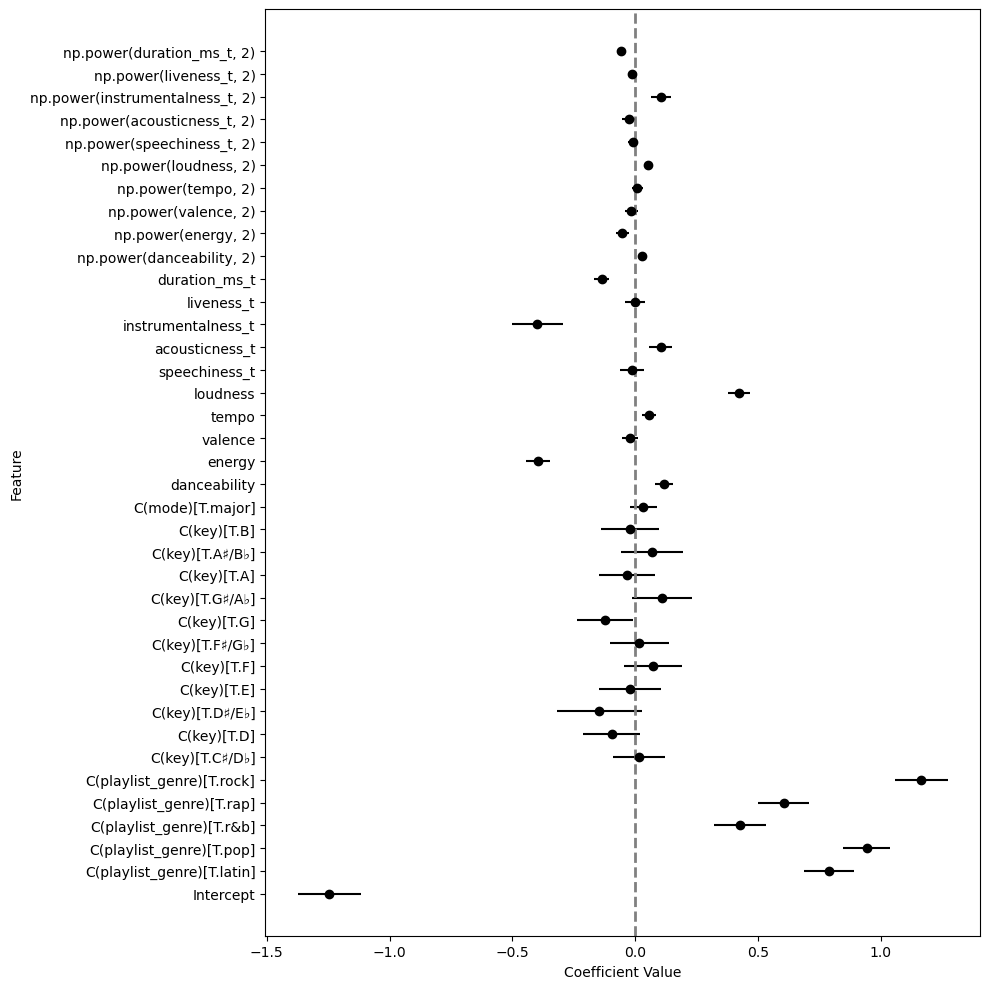

In [163]:
# Postitive and negative features for coefficients, including those that are statistically significant 
my_coefplot(fit_7, figsize_use=(10, 10))

In [164]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_7.params[fit_7.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('C(playlist_genre)[T.latin]', 'positive'),
 ('C(playlist_genre)[T.pop]', 'positive'),
 ('C(playlist_genre)[T.r&b]', 'positive'),
 ('C(playlist_genre)[T.rap]', 'positive'),
 ('C(playlist_genre)[T.rock]', 'positive'),
 ('C(key)[T.G]', 'negative'),
 ('danceability', 'positive'),
 ('energy', 'negative'),
 ('tempo', 'positive'),
 ('loudness', 'positive'),
 ('acousticness_t', 'positive'),
 ('instrumentalness_t', 'negative'),
 ('duration_ms_t', 'negative'),
 ('np.power(danceability, 2)', 'positive'),
 ('np.power(energy, 2)', 'negative'),
 ('np.power(loudness, 2)', 'positive'),
 ('np.power(instrumentalness_t, 2)', 'positive'),
 ('np.power(duration_ms_t, 2)', 'negative')]

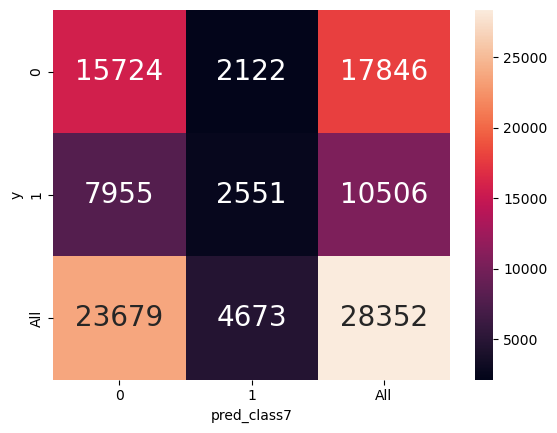

In [165]:
# Confusion heatmap
cm_df['pred_probability7'] = fit_7.predict(df_model_copy)
cm_df['pred_class7'] = np.where(cm_df.pred_probability7 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class7, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

#### Model 8

In [166]:
# Model 8: Pairwise interactions for all continuous variables alongside their linear mains and categorical predictors.
formula_8 = f'y ~ {cat_terms} + ({cont_terms})**2'

results_list.append(fit_and_assess_logistic(8, formula_8, train_data=df_model_copy, threshold=0.5))
roc_list.append(fit_logistic_make_roc(8, formula_8, train_data=df_model_copy))

Optimization terminated successfully.
         Current function value: 0.619842
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.619842
         Iterations 6


In [167]:
# Fit model 8
fit_8 = smf.logit(formula=formula_8, data=df_model_copy).fit()

Optimization terminated successfully.
         Current function value: 0.619842
         Iterations 6


In [168]:
# How many coefficients were estimated?
len(fit_8.params)

73

In [169]:
# How many coefficients are statsically significant?
sum(fit_8.pvalues < 0.05)

30

In [170]:
# Which two statistically significant coefficients have the highest magnitude coefficient values (excluding intercept)
display(fit_8.params[fit_8.pvalues < 0.05].abs().sort_values(ascending=False).index[1:3])

Index(['C(playlist_genre)[T.rock]', 'C(playlist_genre)[T.pop]'], dtype='object')

For clearer readability on this complex model, only the statistically significant variables and their coefficient signs are listed below.

In [171]:
# Postitive and negative features for statistically significant coefficients
sig_coefs = fit_8.params[fit_8.pvalues < 0.05]
signs = ['positive' if v > 0 else 'negative' for v in sig_coefs]
list(zip(sig_coefs.index, signs))

[('Intercept', 'negative'),
 ('C(playlist_genre)[T.latin]', 'positive'),
 ('C(playlist_genre)[T.pop]', 'positive'),
 ('C(playlist_genre)[T.r&b]', 'positive'),
 ('C(playlist_genre)[T.rap]', 'positive'),
 ('C(playlist_genre)[T.rock]', 'positive'),
 ('C(key)[T.G]', 'negative'),
 ('danceability', 'positive'),
 ('energy', 'negative'),
 ('tempo', 'positive'),
 ('loudness', 'positive'),
 ('speechiness_t', 'negative'),
 ('acousticness_t', 'positive'),
 ('instrumentalness_t', 'negative'),
 ('duration_ms_t', 'negative'),
 ('danceability:energy', 'negative'),
 ('danceability:loudness', 'positive'),
 ('danceability:instrumentalness_t', 'negative'),
 ('danceability:liveness_t', 'positive'),
 ('danceability:duration_ms_t', 'negative'),
 ('energy:loudness', 'negative'),
 ('energy:speechiness_t', 'negative'),
 ('valence:acousticness_t', 'negative'),
 ('tempo:speechiness_t', 'positive'),
 ('tempo:acousticness_t', 'positive'),
 ('loudness:instrumentalness_t', 'negative'),
 ('loudness:duration_ms_t', 'ne

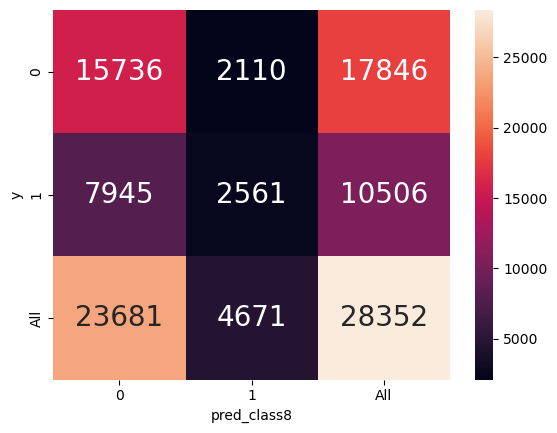

In [172]:
# Confusion heatmap
cm_df['pred_probability8'] = fit_8.predict(df_model_copy)
cm_df['pred_class8'] = np.where(cm_df.pred_probability8 > 0.5, 1, 0 )

sns.heatmap(pd.crosstab(cm_df.y, cm_df.pred_class8, margins=True),
            annot=True, annot_kws={'size': 20}, fmt='d')
plt.show()

### Model Evaluation Results

#### Accuracy

In [173]:
# Combine results into a dataframe and sort by descending accuracy
# Display the Accuracy, Sensitivity, Specificity, and FPR on the training set assuming a 0.5 threshold
results_df = pd.concat(results_list, ignore_index=True)
results_df.sort_values(by=['Accuracy'], ascending=False)

,model_name,model_formula,num_coefs,threshold,Accuracy,Sensitivity,Specificity,FPR,ROC_AUC,Precision:,F1
5,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198,0.5,0.654522,0.271559,0.879973,0.120027,0.674026,0.571171,0.368105
7,8,y ~ C(playlist_genre) + C(key) + C(mode) + (da...,73,0.5,0.645351,0.243765,0.881766,0.118234,0.660595,0.548277,0.337484
6,7,y ~ C(playlist_genre) + C(key) + C(mode) + dan...,38,0.5,0.644575,0.242814,0.881094,0.118906,0.655689,0.545902,0.336122
4,5,y ~ (danceability + energy + valence + tempo +...,56,0.5,0.641225,0.156196,0.926762,0.073238,0.637696,0.556649,0.243942
3,4,y ~ C(playlist_genre) + C(key) + C(mode) + dan...,28,0.5,0.640449,0.209975,0.893870,0.106130,0.651419,0.538049,0.302068
2,3,y ~ danceability + energy + valence + tempo + ...,11,0.5,0.632689,0.099372,0.946655,0.053345,0.619004,0.523046,0.167013
0,1,y ~ 1,1,0.5,0.629444,0.000000,1.000000,0.000000,0.500000,0.000000,0.000000
1,2,y ~ C(playlist_genre) + C(key) + C(mode),18,0.5,0.629444,0.000000,1.000000,0.000000,0.599031,0.000000,0.000000


#### ROC AUC

In [174]:
results_df.sort_values(by=['ROC_AUC'], ascending=False)

,model_name,model_formula,num_coefs,threshold,Accuracy,Sensitivity,Specificity,FPR,ROC_AUC,Precision:,F1
5,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198,0.5,0.654522,0.271559,0.879973,0.120027,0.674026,0.571171,0.368105
7,8,y ~ C(playlist_genre) + C(key) + C(mode) + (da...,73,0.5,0.645351,0.243765,0.881766,0.118234,0.660595,0.548277,0.337484
6,7,y ~ C(playlist_genre) + C(key) + C(mode) + dan...,38,0.5,0.644575,0.242814,0.881094,0.118906,0.655689,0.545902,0.336122
3,4,y ~ C(playlist_genre) + C(key) + C(mode) + dan...,28,0.5,0.640449,0.209975,0.893870,0.106130,0.651419,0.538049,0.302068
4,5,y ~ (danceability + energy + valence + tempo +...,56,0.5,0.641225,0.156196,0.926762,0.073238,0.637696,0.556649,0.243942
2,3,y ~ danceability + energy + valence + tempo + ...,11,0.5,0.632689,0.099372,0.946655,0.053345,0.619004,0.523046,0.167013
1,2,y ~ C(playlist_genre) + C(key) + C(mode),18,0.5,0.629444,0.000000,1.000000,0.000000,0.599031,0.000000,0.000000
0,1,y ~ 1,1,0.5,0.629444,0.000000,1.000000,0.000000,0.500000,0.000000,0.000000


#### ROC Curve

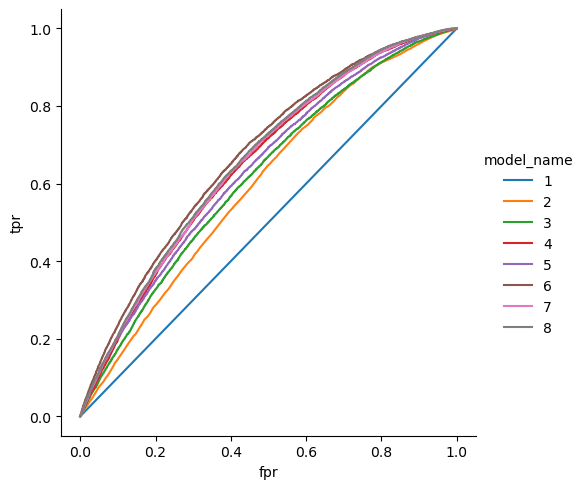

In [175]:
# Combine the ROC results into a dataframe
roc_df = pd.concat(roc_list, ignore_index=True)
roc_df

# Visualize the ROC curve for each model on a line chart
roc_df['model_name'] = roc_df.model_name.astype('category')

sns.relplot(data = roc_df, x='fpr', y='tpr', hue='model_name',
            kind='line', estimator=None, units='model_name')

plt.show()

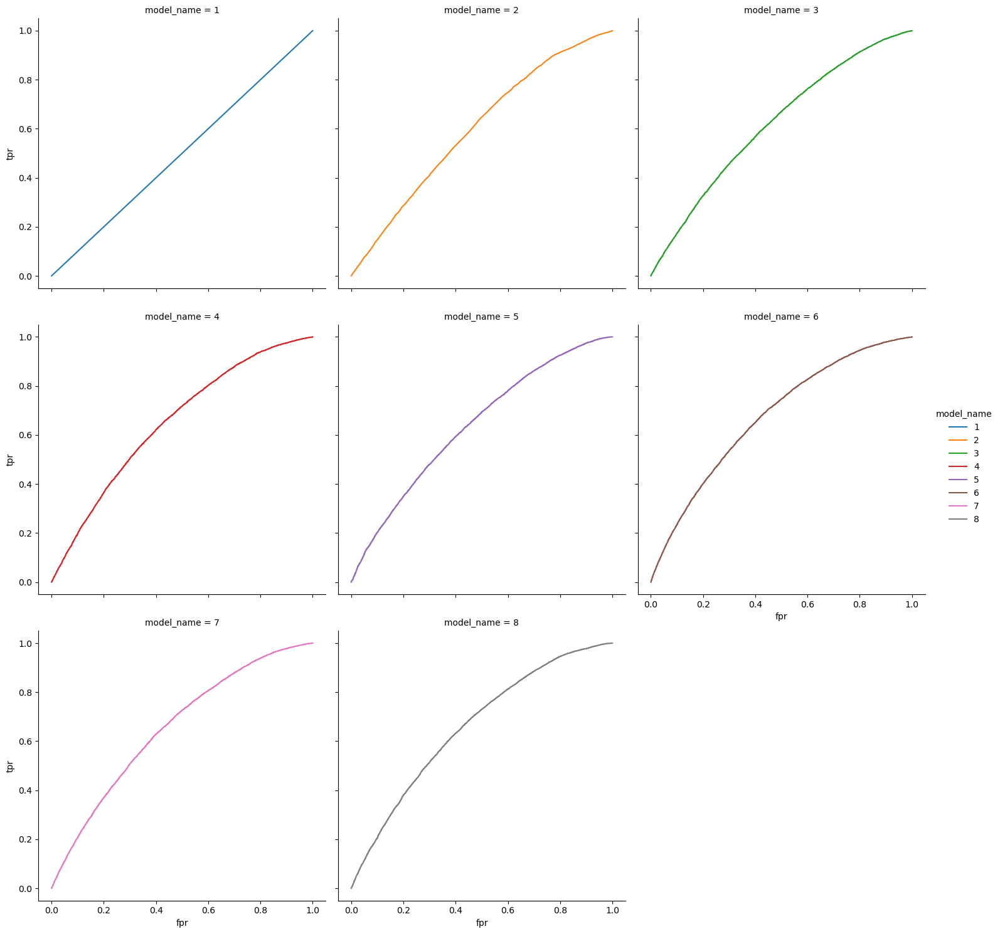

In [176]:
# Visualize the ROC curve for each model on separate facets
sns.relplot(data = roc_df, x='fpr', y='tpr', hue='model_name',
            kind='line', estimator=None, units='model_name',
            col='model_name', col_wrap=3)

plt.show()

#### Model with best performance

`Model 6` showed the best performance on the training set with a ROC AUC of `0.674` and an accuracy of `65.4%`, outperforming all simpler models and the intercept-only baseline. It used `198` coefficients, making it the most complex model overall.

`Models 7` and `8` performed almost as well for both ROC AUC and accuracy values, even though they used far fewer coefficients (`38` and `73`, respectively).

As the models became more complex, they fit the training data better but also showed signs of possible overfitting.

## E. Models: Predictions

### Identify three most important inputs

I will use `Model 4` for this task, as it is the all-inputs linear additive model.

In [177]:
# Extract significant coefficients (exclude intercept)
sig_coefs = fit_4.params[fit_4.pvalues < 0.05].drop('Intercept')

# Sort by absolute magnitude: largest to smallest
sig_sorted = sig_coefs.abs().sort_values(ascending=False)

# Build clean DF
sig_coef_df = pd.DataFrame({
    'feature': sig_sorted.index,
    'abs_coefficient': sig_sorted.values,
    'sign': ['positive' if fit_4.params[f] > 0 else 'negative' for f in sig_sorted.index]})

display(sig_coef_df)

,feature,abs_coefficient,sign
0,C(playlist_genre)[T.rock],1.152556,positive
1,C(playlist_genre)[T.pop],0.965054,positive
2,C(playlist_genre)[T.latin],0.837362,positive
3,C(playlist_genre)[T.rap],0.630450,positive
4,C(playlist_genre)[T.r&b],0.428583,positive
5,loudness,0.388688,positive
6,energy,0.367619,negative
7,instrumentalness_t,0.177929,negative
8,duration_ms_t,0.123891,negative
9,C(key)[T.G],0.112027,negative


Based on the magnitudes of the statistically significant coefficients, the 3 most important inputs  are `playlist_genre`, `loudness`, and `energy`. Two of these inputs are continuous and one is categorical.

### Input Grid

This grid will contain:
* The most important continuous variable across 101 values: `loudness`
* Most important categorical variable across all its unique values: `playlist_genre`
* One other variable (continuous) accross 5 unique values: `energy`
* All other inputs will stay constant (median for continuous, mode for categorical)

In [178]:
# Three most important inputs
main_cont_var = 'loudness'          
hue_var       = 'playlist_genre'   
facet_var     = 'energy'            

# Constants for all other inputs
const_vals = {}
for c in df_mod_X_cont:
    const_vals[c] = float(df_model_copy[c].median())
for c in df_mod_X_cat:
    const_vals[c] = df_model_copy[c].mode()[0]

# Values for the 3 varying inputs
playlist_genre_vals = df_model_copy['playlist_genre'].unique()
loudness_vals = np.linspace(df_model_copy['loudness'].min(),
                            df_model_copy['loudness'].max(), 101)
energy_vals = np.linspace(df_model_copy['energy'].min(),
                          df_model_copy['energy'].max(), 5)

# Column order
cols_order = df_mod_X_cat + df_mod_X_cont

# Build fresh rows using ONLY these grid values
rows = []
for pg in playlist_genre_vals:
    for l in loudness_vals:
        for e in energy_vals:
            row = {c: const_vals[c] for c in cols_order}
            row['playlist_genre'] = pg    
            row['loudness'] = l      
            row['energy'] = e           
            rows.append(row)

# Create input grid
input_grid = pd.DataFrame(rows, columns=cols_order)

In [179]:
input_grid.nunique()

playlist_genre          6
key                     1
mode                    1
danceability            1
energy                  5
valence                 1
tempo                   1
loudness              101
speechiness_t           1
acousticness_t          1
instrumentalness_t      1
liveness_t              1
duration_ms_t           1
dtype: int64

### Make predictions

**I will predict:**
* The model with all inputs and linear additive features: `Model 4`
* The best model on the training set: `Model 6`


In [180]:
# Make a copy of the input grid
dfviz = input_grid.copy()

In [181]:
# Add a column for predicted probability using `Model 4`
dfviz['pred_probability_mod4'] = fit_4.predict(input_grid)

In [182]:
# Add a column for predicted probability using `Model 6`
dfviz['pred_probability_mod6'] = fit_6.predict(input_grid)

### Event Probability Visualizations

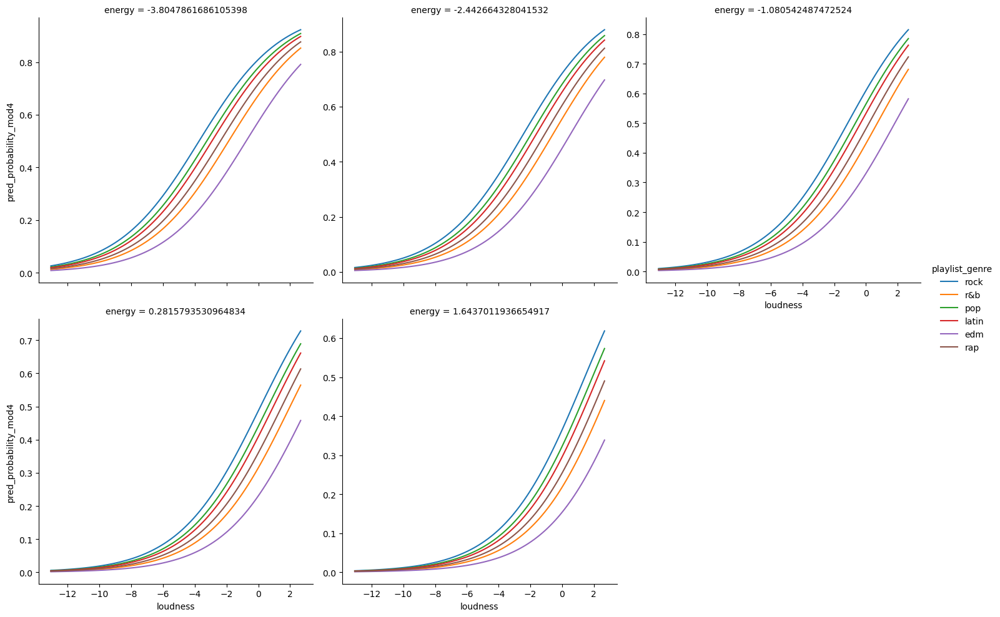

In [183]:
# Visualize the model 4 predictions
sns.relplot(data=dfviz, x='loudness', y='pred_probability_mod4', hue='playlist_genre', col='energy', 
            kind='line', estimator=None, units='playlist_genre',
            col_wrap=3, facet_kws={'sharey': False})

plt.show()

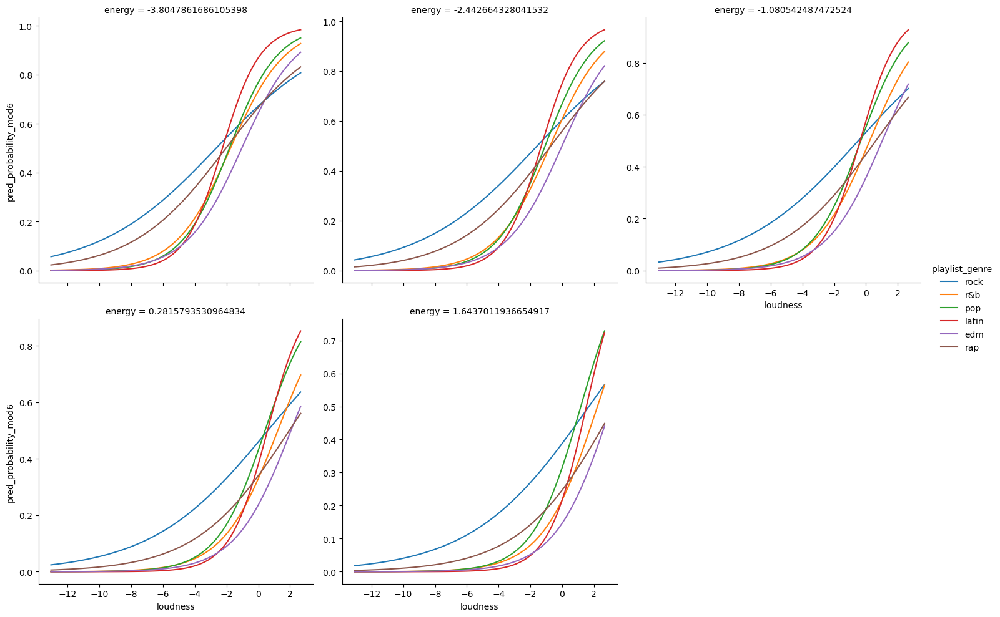

In [184]:
# Visualize the model 6 predictions
sns.relplot(data=dfviz, x='loudness', y='pred_probability_mod6', hue='playlist_genre', col='energy', 
            kind='line', estimator=None, units='playlist_genre',
            col_wrap=3, facet_kws={'sharey': False})

plt.show()

#### Model Trends

**Model 4:** Shows smooth and fairly parallel curves across genres, meaning `loudness` increases the event probability in a consistent way. The spread between `genres` is also similar across `energy levels`.

**Model 6:** Shows less parallel curves, and some `genres` rise much faster or slower depending on the `energy` level. This means `Model 6` is capturing certain effects that Model 4 cannot represent.

#### Trends in uncertainty

`Model 4`’s flatter, more similar curves indicate greater uncertainty in its predictions, while `Model 6`’s wider separation suggests higher confidence, although it may also increase the risk of overfitting.

## F.  Models: Performance and Validation 

**Models I have selected:**
* `Model 6`: Best model on training set with 198 coefficients
* `Model 3`: Simple model (continuous additive features) with 11 coefficients
* `Model 4`: Medium complexity (all inputs with additive features) with 28 coefficients

In [185]:
# Import modules
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from patsy import dmatrices

#### Define a function to manage the cross-validation for a given the `model name`, `formula`, and `data set`.

In [186]:
def train_and_test_logistic_with_cv(mod_name, a_formula, init_mod, data_df, cv):
    # create the feature and output arrays BASED on the provided formula
    y, X = dmatrices( a_formula, data=data_df )
    
    # initialize the performance metric storage
    train_res = []
    test_res = []
    
    # split the data and iterate over the folds
    for train_id, test_id in cv.split( X, y.ravel() ):
        # subset the training and testing features
        X_train = X[train_id]
        X_test = X[test_id]
        
        # subset the training and testing output
        y_train = y[train_id]
        y_test = y[test_id]
        
        # FIT the model on the TRAINING SET
        fit_mod = init_mod.fit( X_train, y_train.ravel() )
        
        # SCORE the model -- calculate the performance metric
        # training set SCORE
        train_res.append( fit_mod.score( X_train, y_train.ravel() ) )
        # test set SCORE
        test_res.append( fit_mod.score( X_test, y_test.ravel() ) )
    
    # book keeping
    train_df = pd.DataFrame({'Accuracy': train_res})
    train_df['from_set'] = 'training'
    train_df['fold_id'] = train_df.index + 1
    
    test_df = pd.DataFrame({'Accuracy': test_res})
    test_df['from_set'] = 'testing'
    test_df['fold_id'] = test_df.index + 1
    
    # combine the results together
    res_df = pd.concat([train_df, test_df], ignore_index=True)
    
    # add information about the model
    res_df['model_name'] = mod_name
    res_df['model_formula'] = a_formula
    res_df['num_coefs'] = fit_mod.coef_.ravel().size
    
    return res_df

#### Cross Validation

For cross-validation, I used the log transformed version of the dataset to correct skewness. I did not standardize the variables ahead of time because scaling must be applied within each fold, and logistic regression without regularization does not require standardized inputs.

In [187]:
# build CV dataset: log-transformed but not standardized
df_cv = df_mod[model_cols].copy()
df_cv = df_cv.rename(columns={'track_popularity_binary': 'y'})

In [188]:
# Use 5-fold cross-validation
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=9483156)

In [189]:
# Initialize the sklearn Logistic Regression model
sk_min_loss = LogisticRegression(penalty=None, solver='lbfgs', fit_intercept=False, max_iter=25001)

In [190]:
# Create a list to hold results from three different models
train_test_results_list = []

In [191]:
# Train and test results for `Model 6`
train_test_results_list.append(train_and_test_logistic_with_cv(mod_name=6, a_formula=formula_6, init_mod=sk_min_loss, 
                                                       data_df=df_cv, cv=kf))

In [192]:
# Train and test results for `Model 3`
train_test_results_list.append(train_and_test_logistic_with_cv(mod_name=3, a_formula=formula_3, init_mod=sk_min_loss, 
                                                       data_df=df_cv, cv=kf))

In [193]:
# Train and test results for `Model 4`
train_test_results_list.append(train_and_test_logistic_with_cv(mod_name=4, a_formula=formula_4, init_mod=sk_min_loss, 
                                                       data_df=df_cv, cv=kf))

#### View testing and training results for each model

In [194]:
cv_results = pd.concat(train_test_results_list, ignore_index=True )
cv_results

,Accuracy,from_set,fold_id,model_name,model_formula,num_coefs
0,0.654292,training,1,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
1,0.653543,training,2,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
2,0.656071,training,3,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
3,0.657878,training,4,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
4,0.654087,training,5,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
5,0.649268,testing,1,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
6,0.652971,testing,2,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
7,0.642681,testing,3,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
8,0.640741,testing,4,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198
9,0.646914,testing,5,6,y ~ (C(playlist_genre) + C(key) + C(mode)) * (...,198


In [195]:
cv_results[['model_name', 'from_set']].value_counts()

model_name  from_set
3           testing     5
            training    5
4           testing     5
            training    5
6           testing     5
            training    5
Name: count, dtype: int64

#### Visualize testing and training results for each model

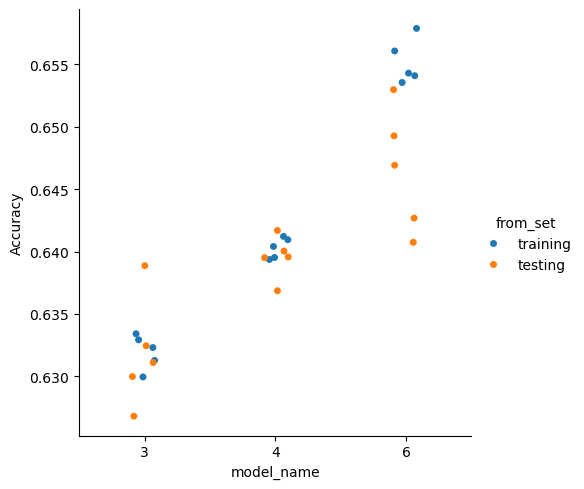

In [196]:
# Visualize the accuracy for each model in each fold with a strip plot
sns.catplot(data = cv_results, x='model_name', y='Accuracy', hue='from_set')

plt.show()

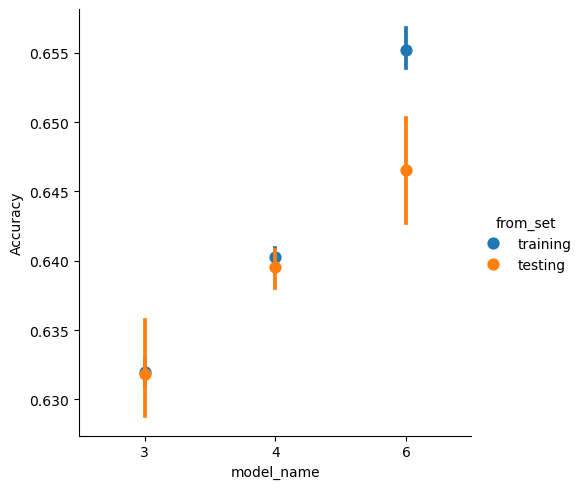

In [197]:
# Visualize the average performance accuracy with a point plot
sns.catplot(data = cv_results, x='model_name', y='Accuracy', hue='from_set', kind='point', join=False,
            errorbar=('ci', 95))

plt.show()

#### Final Model Selection

Based on cross-validation, `Model 6` had the highest testing accuracy, making it the best overall model. This result is consistent with the training-set evaluation, where `Model 6` was also the top performer. `Model 6` is the most complex model, containing `198` regression coefficients.

`Model 4` came in second place and was very close to `Model 6`, while using only `28` coefficients. `Model 3` had the lowest cross-validated accuracy. The comparison shows that more flexibility helps performance in this dataset, although the improvement from `Model 4` to `Model 6` is fairly small relative to the big jump in model size.